## Analysis

In [131]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
import warnings
warnings.filterwarnings('ignore')

%matplotlib notebook
import matplotlib.pylab as plt
from matplotlib.patches import Ellipse

import pandas as pd

import seaborn as sns
sns.set(style="whitegrid")

import numpy as np

from astropy.io import fits
from astropy import units as u
from astropy.table import Table,Column

import linmix
import pymc3 as pm
import pickle

from astroML.plotting import setup_text_plots
setup_text_plots(fontsize=11, usetex=False)

from scipy.stats import spearmanr

np.random.seed(1)

**Import data**

In [192]:
# To keep an eye on units
as1063_astropy = Table.read('as1063_clump_properties.fits')
a521_astropy = Table.read('a521_clump_properties.fits')
m1206_astropy = Table.read('snake_clump_properties.fits')

as1063 = as1063_astropy.to_pandas()
a521 = a521_astropy.to_pandas()
m1206 = m1206_astropy.to_pandas()

In [193]:
as1063_noise_astropy = Table.read('as1063_noise_clump_properties.fits') 
as1063_noise = as1063_noise_astropy.to_pandas()

a521_noise_astropy = Table.read('a521_noise_clump_properties.fits') 
a521_noise = a521_noise_astropy.to_pandas()

m1206_noise_astropy = Table.read('snake_noise_clump_properties.fits') 
m1206_noise = m1206_noise_astropy.to_pandas()

Import data from Bolatto 2008 for comparision

In [194]:
bolatto_astropy = Table.read('../Data/Literature/asu.fit') 
bolatto = bolatto_astropy.to_pandas()

# not sure why, but there are a lot of detections with zero size
bolatto = bolatto[bolatto.logR > 0]

Swinbank 2011 and Swinbank 2015. Quite manually, but works

In [195]:
d = {}
d['name'] =  ['Z1',  'Z2',  'Y1',  'Y2',   'X', 'A', 'B', 'C', 'D', 'E']
d['year'] =       ['2011',  '2011',  '2011',  '2011',   '2011','2015' ,'2015', '2015' ,'2015','2015']
d['mass'] =       [4.0e8, 3.3e8, 7.8e8, 14.2e8, 3.6e8, 1.2e8, 2.8e8, 4.8e8 , 0.8e8, 0.7e8]
d['size'] =       [90,    90 ,   98,    180,    402, 282, 188, 305, 300, 170]
d['line_width'] = [47,    110,   57,    79,     78, 30, 35, 31, 11 ,31]

swinbank = pd.DataFrame(data=d)

**Massage data a little bit**

In [196]:
m1206.ix[10,'radius_not_corrected'] = 1.0

Add L_CO10

In [197]:
as1063['Ll_CO10'] = as1063['Ll_CO43']/0.33
a521['Ll_CO10']   = a521['Ll_CO43']/0.33
m1206['Ll_CO10']  = m1206['Ll_CO43']/0.33

as1063_noise['Ll_CO10']  = as1063_noise['Ll_CO43']/0.33
a521_noise['Ll_CO10']  = a521_noise['Ll_CO43']/0.33
m1206_noise['Ll_CO10']  = m1206_noise['Ll_CO43']/0.33

Put all the tables together

In [198]:
as1063['mlt_region'] = 1

# region names
#['A','AS-C','AS-E','AS-W','M-S','M-C','M-N']
as1063['region'] = 'AS'
a521['region'] = 'A-C'
a521.ix[a521.mlt_region==2,'region'] = 'A-E'
a521.ix[a521.mlt_region==3,'region'] = 'A-W'
m1206['region'] = 'M-S'
m1206.ix[m1206.mlt_region==2,'region'] = 'M-C'
m1206.ix[m1206.mlt_region==3,'region'] = 'M-N'

all_data = pd.concat([as1063,a521,m1206],keys=['as1063','a521','m1206'],names=['gal','id'])

In [142]:
all_data

Galactic_R        L_CO43    L_CO43_lerr   L_CO43_uerr  \
gal    id                                                          
as1063 0     2.235059  1.164556e+05   45029.120052  3.612050e+04   
       1     1.501822  7.426022e+05  158923.871379  1.802768e+05   
       2     2.951525  9.709879e+04   19724.165543  1.553511e+03   
       3     1.743589  2.100900e+05   70043.407012  6.475065e+04   
       4     2.669459  2.846623e+05   28361.758381  2.689822e+03   
       5     3.319494  4.209416e+04   42544.081498  1.151287e+04   
       6     2.536548  1.384407e+05   24990.037332  1.197833e+03   
a521   0     3.962714  1.251889e+05  133474.392794  5.624397e+04   
       1     4.488351  7.719673e+05   92373.444724  9.237344e+04   
       2     4.099347  3.373223e+05   80767.306972  1.084317e+05   
       3     4.139797  7.238844e+04   76938.382296  4.583961e+04   
       4     3.082979  8.036687e+05   61727.446229  6.172745e+04   
       5     3.660634  1.642088e+05   26178.203639  7.191539e+04   
       6     4.373999  1.823415e+04    4827.784587  4.827785e+03   
       7     4.181765  2.466956e+05  164765.839124  1.647658e+05   
       8     1.576510  7.012486e+06  898532.337676  1.218937e+06   
       9     1.941285  9.456530e+05   68132.694444  6.813269e+04   
       10    3.148746  1.018678e+06   79074.155005  7.907416e+04   
       11    3.679470  1.159420e+04    7456.636349  7.780011e+03   
       12    4.471745  5.966864e+03    1049.913805  1.049914e+03   
       13    4.292629  6.179952e+05   51391.557460  5.139156e+04   
       14    4.246687  4.601852e+03     340.756743  3.407567e+02   
       15    0.777853  8.776503e+04   22906.006386  2.943384e+04   
       16    6.850170  1.018217e+06  186448.600206  2.732569e+05   
       17    3.654836  1.411213e+06  181070.248418  4.986451e+05   
       18    5.456029  1.149981e+06   73346.377996  7.334638e+04   
       19    6.808384  9.172540e+05   56877.285588  5.687729e+04   
m1206  0     0.853654  7.918257e+04   38107.166344  3.877769e+04   
       1     0.738680  1.560254e+05   84660.319985  8.256389e+04   
       2     0.930859  2.550350e+04   19680.526846  2.195581e+04   
       3     1.198571  1.555672e+05   64000.680395  6.104883e+04   
       4     1.105689  6.700660e+05  223781.188054  2.237812e+05   
       5     0.924067  2.880304e+04   29117.353231  3.307865e+04   
       6     1.047159  2.437408e+06  906085.803107  8.835943e+05   
       7     0.546608  2.308202e+04    5124.001814  2.747047e+03   
       8     1.030235  6.186013e+04   53620.166860  5.640268e+04   
       9     1.291112  2.020717e+05   43086.430034  4.308643e+04   
       10    1.862461  8.524794e+04  137936.769195  5.543523e+04   
       11    1.546261  1.682409e+05   23682.758897  2.368276e+04   

                Ll_CO10       Ll_CO43  Ll_CO43_lerr  Ll_CO43_uerr  \
gal    id                                                           
as1063 0   2.691483e+07  8.881895e+06  3.434305e+06  2.754858e+06   
       1   1.716278e+08  5.663718e+07  1.212089e+07  1.374945e+07   
       2   2.244116e+07  7.405582e+06  1.504333e+06  1.184840e+05   
       3   4.855531e+07  1.602325e+07  5.342108e+06  4.938438e+06   
       4   6.579024e+07  2.171078e+07  2.163110e+06  2.051488e+05   
       5   9.728668e+06  3.210460e+06  3.244775e+06  8.780701e+05   
       6   3.199597e+07  1.055867e+07  1.905954e+06  9.135701e+04   
a521   0   1.418661e+07  4.681583e+06  4.991429e+06  2.103308e+06   
       1   8.748063e+07  2.886861e+07  3.454412e+06  3.454412e+06   
       2   3.822593e+07  1.261456e+07  3.020387e+06  4.054928e+06   
       3   8.203180e+06  2.707049e+06  2.877200e+06  1.714225e+06   
       4   9.107308e+07  3.005412e+07  2.308369e+06  2.308369e+06   
       5   1.860842e+07  6.140777e+06  9.789641e+05  2.689359e+06   
       6   2.066325e+06  6.818872e+05  1.805406e+05  1.805406e+05   
       7   2.795596e+07  9.225466e+06  6.161609e+06  6.161609e+06   
       8   7.946667e+08  2.622400e+08  3.360165e+

In [199]:
all_data.radius_not_corrected.value_counts()

0.0    32
1.0     7
Name: radius_not_corrected, dtype: int64

In [200]:
as1063_noise['region'] = 'AS'
a521_noise['region'] = 'A'
m1206_noise['region'] = 'M'

all_noise = pd.concat([as1063_noise,a521_noise,m1206_noise],keys=['as1063','a521','m1206'],names=['gal','id'])

Should have added this before...

In [201]:
def internal_pressure(mol_mass,R,sigma_v):
    return 1176 * mol_mass * R**(-3) * sigma_v**2

all_noise['P_int'] = internal_pressure(all_noise['Mass_mol'],all_noise['R'],all_noise['line_width'])

In [188]:
all_noise

_idx      flux  radius_corrected  radius_not_corrected  \
gal    id                                                           
as1063 0      0  0.000617          0.000020                   1.0   
       1      1  0.000867          0.000024                   1.0   
       2      2  0.000997          0.000001                   0.0   
       3      3  0.000906          0.000024                   1.0   
       4      4  0.001677          0.000019                   0.0   
       5      5  0.000683          0.000020                   1.0   
       6      6  0.000870          0.000024                   1.0   
       7      7  0.001742          0.000021                   0.0   
       8      8  0.000788          0.000022                   1.0   
       9      9  0.000847          0.000023                   1.0   
a521   0      0  0.002199          0.000028                   0.0   
       1      1  0.001090          0.000030                   1.0   
       2      2  0.001590          0.000003                   0.0   
       3      3  0.000995          0.000027                   1.0   
       4      4  0.001376          0.000030                   1.0   
       5      5  0.002899          0.000028                   0.0   
       6      6  0.002120          0.000009                   0.0   
       7      7  0.002888          0.000035                   0.0   
       8      8  0.001437          0.000006                   0.0   
       9      9  0.001187          0.000031                   1.0   
       10    10  0.001757          0.000029                   1.0   
       11    11  0.001560          0.000010                   0.0   
       12    12  0.001107          0.000029                   1.0   
       13    13  0.004162          0.000044                   0.0   
       14    14  0.001453          0.000030                   1.0   
       15    15  0.001040          0.000028                   1.0   
       16    16  0.001308          0.000030                   1.0   
       17    17  0.001221          0.000029                   1.0   
m1206  0      0  0.000922          0.000031                   1.0   
       1      1  0.001431          0.000015                   0.0   
       2      2  0.001084          0.000011                   0.0   
       3      3  0.000895          0.000032                   1.0   
       4      4  0.001059          0.000002                   0.0   
       5      5  0.000850          0.000031                   1.0   
       6      6  0.001311          0.000015                   0.0   
       7      7  0.001184          0.000013                   0.0   
       8      8  0.001133          0.000002                   0.0   
       9      9  0.001143          0.000033                   1.0   
       10    10  0.001610          0.000022                   0.0   
       11    11  0.001010          0.000002                   0.0   

           corrected_area  line_width  line_width_not_corrected            R  \
gal    id                                                                      
as1063 0     1.250000e-09    4.737170                       0.0   938.900887   
       1     1.736111e-09    6.823303                       0.0  1106.505307   
       2     3.617129e-12    8.285025                       0.0    50.506439   
       3     1.736111e-09    7.228090                       1.0  1106.505307   
       4     1.184173e-09    7.281145                       1.0   913.844416   
       5     1.319444e-09    7.588060                       1.0   964.628963   
       6     1.736111e-09    4.365646                       1.0  1106.505307   
       7     1.392506e-09    5.152838                       1.0   990.976335   
       8     1.458333e-09    1.196653                       1.0  1014.128865   
       9     1.597222e-09    7.253051                       1.0  1061.322606   
a521   0     2.391393e-09    2.565964                       1.0  1561.703087   
       1     2.777778e-09    2.660921                       1.0  1683.14

# Mean values of Radius, Mass and linewidth

And some basic tries with hierarchical modelling

**No pooling, separate means** 

In [145]:
all_data[all_data.radius_not_corrected==0].groupby('region').mean()[['Mass_mol','R','line_width','gas_density','P_int']]

,Mass_mol,R,line_width,gas_density,P_int
region,,,,,
A-C,8.064616e+08,1135.114737,26.503444,586.204216,4.176667e+05
A-E,9.045644e+07,281.138585,26.382836,902.481641,5.391836e+06
A-W,8.501057e+07,372.142931,32.516174,431.194750,2.732390e+06
AS,2.632498e+08,699.225982,35.411623,594.052355,1.251053e+06
M-C,7.692941e+07,332.921907,39.273653,805.980480,3.781597e+06
M-N,1.168447e+08,342.263842,56.164493,1229.241547,1.773125e+07
M-S,6.412385e+08,873.938161,50.267447,641.806851,2.014436e+06


In [189]:
all_noise[all_noise.radius_not_corrected==0].groupby('region').mean()[['Mass_mol','R','line_width','gas_density','P_int']]

,Mass_mol,R,line_width,gas_density,P_int
region,,,,,
A,8.281669e+08,1140.488461,11.411033,4223.224870,1.067206e+06
AS,2.820197e+08,651.775730,6.906336,29272.365718,3.991557e+07
M,4.274319e+08,579.669067,4.499669,14723.046799,9.834359e+05


In [158]:
bolatto.mean()

Seq         18.727273
VLSR      -122.215455
logR         1.434455
e_logR       0.091364
logS         0.511091
e_logS       0.079727
logMl        5.189273
e_logMl      0.129455
logMv        5.474091
e_logMv      0.170545
TB           2.517273
recno       88.981818
dtype: float64

In [205]:
10**0.511091

3.244075850506008

Dessaugues-Zavadsky

In [17]:
radius = (89, 30, 147, 50, 210, 54, 138, 99, 143, 78, 59, 78, 51, 179, 148, 135, 67)
sigma = (19, 33, 13, 24, 32, 17, 31, 18, 13, 14, 22, 17, 21, 25, 24, 24, 9)

print(np.mean(radius), np.mean(sigma))

103.23529411764706 20.941176470588236


In [18]:
swinbank.mean()

mass          432000000.0
size                210.5
line_width           50.9
dtype: float64

**Complete pooling, all together**

In [162]:
all_data[all_data.radius_not_corrected==0].mean()[['Mass_mol','R','line_width','gas_density','P_int']]

Mass_mol       3.620156e+08
R              6.536176e+02
line_width     3.504200e+01
gas_density    7.579911e+02
P_int          4.716864e+06
dtype: float64

In [190]:
all_noise[all_noise.radius_not_corrected==0].mean()[['Mass_mol','R','line_width','gas_density','P_int']]

Mass_mol       5.732026e+08
R              8.271888e+02
line_width     7.789717e+00
gas_density    1.259933e+04
P_int          7.165887e+06
dtype: float64

# Larson relations

<IPython.core.display.Javascript object>


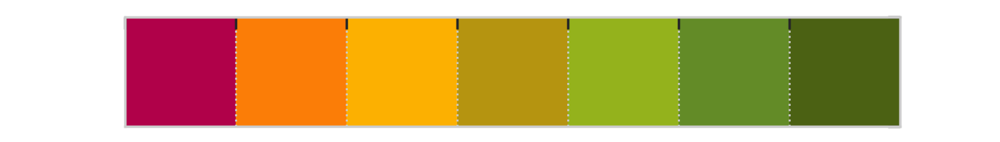

In [21]:
sns.palplot(sns.xkcd_palette(['raspberry','pumpkin orange','yellow orange','dark gold','sickly green','mossy green','camouflage green']))

cmap = sns.xkcd_palette(['raspberry','pumpkin orange','yellow orange','dark gold','sickly green','mossy green','camouflage green'])
names = ['A','AS-C','AS-E','AS-W','M-S','M-C','M-N']

## Mass vs radius

Prepare Data

In [22]:
# Prepare the data
data_x = np.log10(all_data['R'])
data_y = np.log10(all_data['Mass_mol'])
uncertainty_x = np.mean((all_data['R_lerr'],all_data['R_uerr']),axis=0)/all_data['R']
uncertainty_y = np.mean((all_data['Mass_mol_lerr'],all_data['Mass_mol_uerr']),axis=0)/all_data['Mass_mol']
log_xs = np.log10(np.logspace(0,3.4,10))

noise_x = np.log10(all_noise['R'])
noise_y = np.log10(all_noise['Mass_mol'])

bolatto_x = bolatto['logR']
bolatto_y = bolatto['logMl']

def plot_data_mass_radius():
    fig, ax = plt.subplots(1,1,figsize=(5,5))
    fig.subplots_adjust(left=0.2, right=0.98, bottom=0.15, top=0.95)
    
    sns.scatterplot('R','Mass_mol',data=all_data, hue='region',
                palette=cmap,zorder=10,s=100, alpha=0.8, ax = ax)
    sns.scatterplot('R','Mass_mol',data=all_noise, s=50, 
                    alpha=0.8, ax = ax, color='red')
    sns.scatterplot(10**bolatto_x,10**bolatto_y, s=50, alpha=0.8, ax = ax)
    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_xlim(-10,2000)
    ax.set_ylim(1e4,1e10)
    ax.set_xlabel('R (pc)')
    ax.set_ylabel('M$_{lum}$ (M$_\odot$)')
    return ax    

### Complete polling

<IPython.core.display.Javascript object>


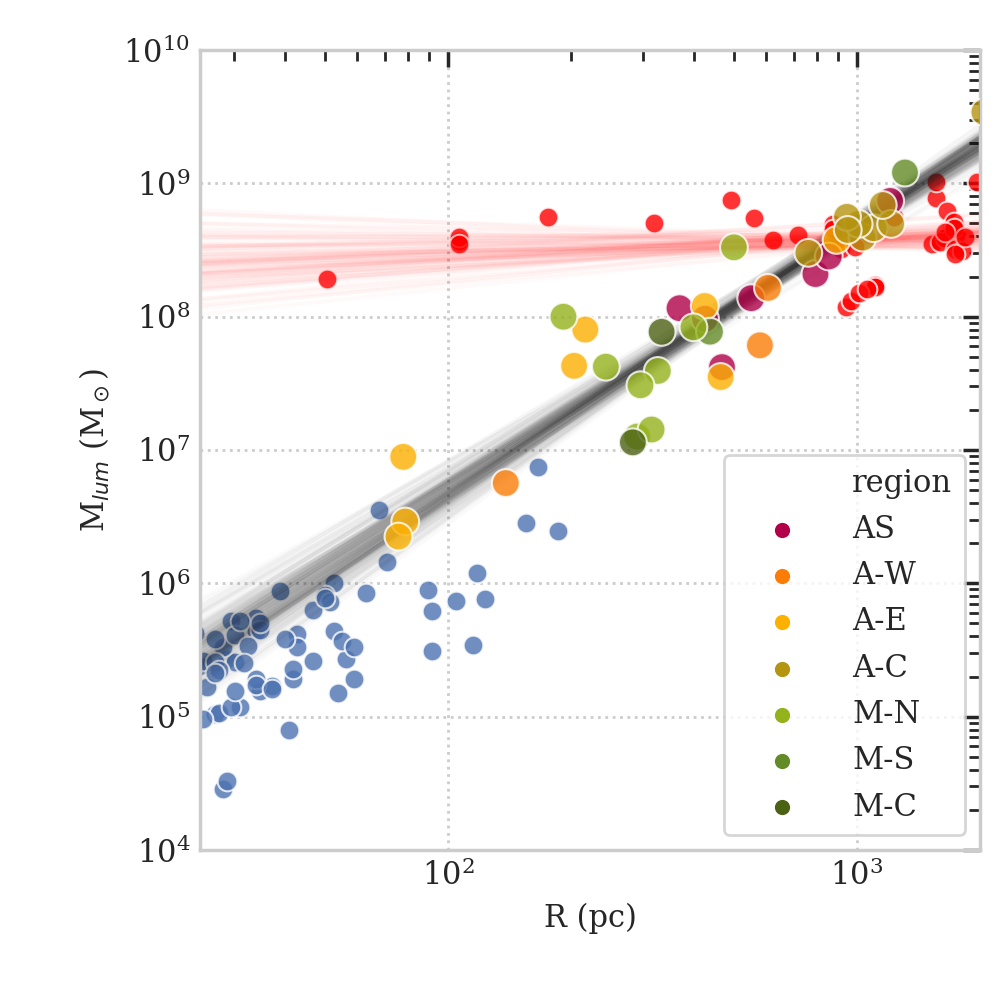

Data: alpha = 2.71, beta = 1.990568, epsilon = 0.008669
Noise: alpha = 8.29, beta = 0.097079, epsilon = 0.067501


In [24]:
### Data ###
lm = linmix.LinMix(data_x, data_y, uncertainty_x, uncertainty_y, K=2)
lm.run_mcmc(silent=True)

ax = plot_data_mass_radius()
for i in range(0, len(lm.chain), 50):
    log_ys = lm.chain[i]['alpha'] + log_xs * lm.chain[i]['beta']
    ax.plot(10**log_xs, 10**log_ys, color='k', alpha=0.02)

print('Data: alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(lm.chain['alpha'].mean(),lm.chain['beta'].mean(),lm.chain['sigsqr'].mean()))


### Noise ####
lm_noise = linmix.LinMix(noise_x, noise_y, K=2)
lm_noise.run_mcmc(silent=True)

for i in range(0, len(lm_noise.chain), 100):
    log_ys = lm_noise.chain[i]['alpha'] + log_xs * lm_noise.chain[i]['beta']
    ax.plot(10**log_xs, 10**log_ys, color='red', alpha=0.02)

print('Noise: alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(lm_noise.chain['alpha'].mean(),lm_noise.chain['beta'].mean(),lm_noise.chain['sigsqr'].mean()))

**Pymc3**

In [25]:
import pickle

def save_traces(name,trace,model):
    import pickle # python3

    with open(name+'.pkl', 'wb') as buff:
        pickle.dump({'model': model, 'trace': trace}, buff)

def load_traces(name):
    with open(name+'.pkl', 'rb') as buff:
        data = pickle.load(buff)  
    model, trace = data['model'], data['trace']
    return  trace, model

def print_results(trace,ax,color='k',Print=True):
    try:
        mean_intercept = trace.get_values('intercept').mean()
        mean_gradient = trace.get_values('gradient').mean()
    except KeyError:
        mean_intercept = trace.get_values('mu_a').mean()
        mean_gradient = trace.get_values('mu_b').mean()
    ax.plot(10**log_xs, 10**(mean_intercept + mean_gradient*log_xs), color=color, alpha=1, label='Normal likelihood',linewidth=2,linestyle=':') 
    if Print:
        print('alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(mean_intercept,mean_gradient,trace.get_values('epsilon').mean()))

**Complete pooling**

In [26]:
with pm.Model() as model_mass_radius:
    
    intercept = pm.Normal('intercept', 3, sd=2)
    gradient = pm.Normal('gradient', 2, sd=2)
    epsilon = pm.HalfCauchy('epsilon', 2)

    # depends on your prior knowledge of true_x
    true_x = pm.Normal('true_x', mu=np.mean(data_x), sd=np.std(data_x), shape=len(data_x)) 
    likelihood_x = pm.Normal('x', mu=true_x, sd=uncertainty_x, observed=data_x)
    
    true_y = pm.Normal('true_y', mu = intercept + gradient * true_x, sd=epsilon, shape=len(data_x))
    likelihood_y = pm.Normal('y', mu=true_y, sd=uncertainty_y, observed=data_y)
    
    trace_mass_radius = pm.sample(4000,chains=10,tune=1000,cores=3)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 3 jobs)
NUTS: [true_y, true_x, epsilon, gradient, intercept]
Sampling 10 chains: 100%|██████████| 50000/50000 [09:54<00:00, 84.04draws/s] 
There were 3084 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.22921189826480612, but should be close to 0.8. Try to increase the number of tuning steps.
There were 799 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6573826435084016, but should be close to 0.8. Try to increase the number of tuning steps.
There were 1226 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.5651403832676573, but should be close to 0.8. Try to increase the number of tuning steps.
There were 897 divergences after tu

In [27]:
save_traces('mass_radius_complete_pooling',trace_mass_radius,model_mass_radius)

<IPython.core.display.Javascript object>


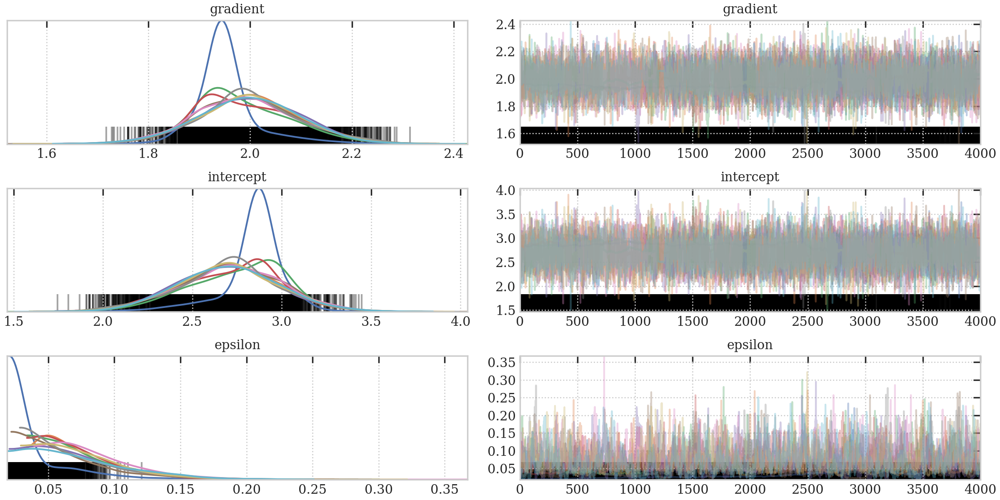

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x11fd07ef0>,
      dtype=object)

In [28]:
pm.traceplot(trace_mass_radius,['gradient','intercept','epsilon'])

**Fitting noise**

In [29]:
with pm.Model() as model_mass_radius_noise:
    
    intercept = pm.Normal('intercept', 5, sd=2)
    gradient = pm.Normal('gradient', 1, sd=1)
    epsilon = pm.HalfCauchy('epsilon', 1)

    likelihood = pm.Normal('y', mu = intercept + gradient * noise_x, sd=epsilon, observed=noise_y)

    trace_mass_radius_noise = pm.sample(4000,chains=5,tune=500,cores=3)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (5 chains in 3 jobs)
NUTS: [epsilon, gradient, intercept]
Sampling 5 chains: 100%|██████████| 22500/22500 [00:51<00:00, 432.93draws/s]
The acceptance probability does not match the target. It is 0.8888878329477831, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.8985505698559164, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.8788839674087178, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.8847564298459468, but should be close to 0.8. Try to increase the number of tuning steps.


<IPython.core.display.Javascript object>


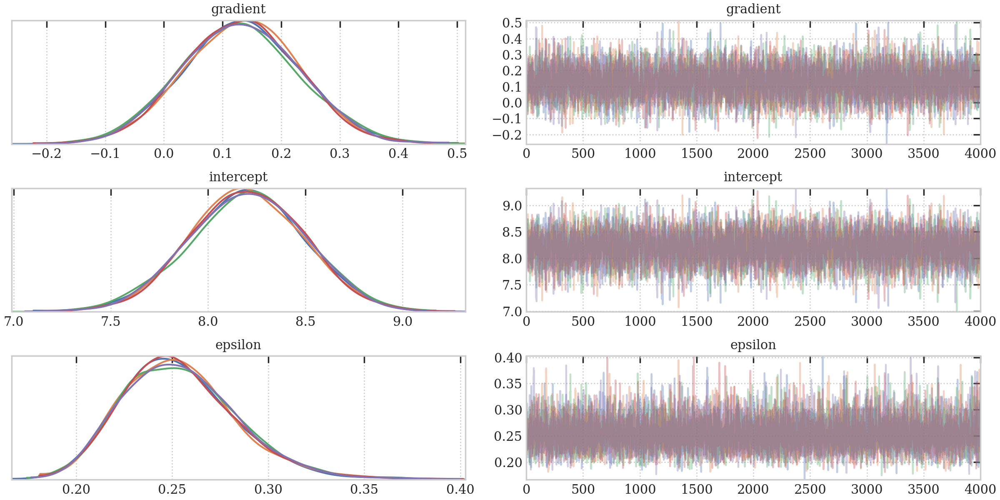

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x12546df98>,
      dtype=object)

In [30]:
pm.traceplot(trace_mass_radius_noise,['gradient','intercept','epsilon'])

## Hierarchical 

In [32]:
reg_idx = all_data['region'].values
translate = {'AS':0, 'A-W':1 , 'A-E':2 ,'A-C':3, 'M-S':4, 'M-C':5, 'M-N':6 }
reg_id_numerical = [translate[reg] for reg in reg_idx]
print(reg_id_numerical)

[0, 0, 0, 0, 0, 0, 0, 1, 2, 1, 2, 3, 2, 2, 2, 3, 3, 3, 1, 2, 3, 2, 2, 3, 3, 3, 3, 6, 4, 6, 5, 6, 6, 4, 5, 6, 6, 6, 6]


In [33]:
with pm.Model() as model_mass_radius_noise_hierarchical:
    
    # Hyperpriors for group nodes    
    mu_a = pm.Normal('mu_a', mu=3.0, sigma=1)
    sigma_a = pm.HalfNormal('sigma_a', 2.)
    mu_b = pm.Normal('mu_b', mu=2., sigma=0.5)
    sigma_b = pm.HalfNormal('sigma_b', 1)
    
    # Intercept for each galaxy, distributed around group mean mu_a
    # Above we just set mu and sd to a fixed value while here we
    # plug in a common group distribution for all a and b (which are
    # vectors of length names).
    a = pm.Normal('a', mu=mu_a, sigma=sigma_a, shape=len(names))
    # Intercept for each county, distributed around group mean mu_a
    b = pm.Normal('b', mu=mu_b, sigma=sigma_b, shape=len(names))

    # Model error
    epsilon = pm.HalfCauchy('epsilon', 1)

    # Model data
    true_x = pm.Normal('true_x', mu = np.mean(data_x), sigma = np.std(data_x), shape=len(data_x)) 
    likelihood_x = pm.Normal('x', mu = true_x, sigma = uncertainty_x, observed=data_x, shape=len(names))
    
    true_y = pm.Normal('true_y', mu = a[reg_id_numerical] + b[reg_id_numerical] * true_x, sigma=epsilon, shape=len(data_y))    
    likelihood_y = pm.Normal('y',mu = true_y, sigma = uncertainty_y, observed=data_y, shape=len(names))
    
    trace_mass_radius_noise_hierarchical = pm.sample(4000,chains=12,tune=1000,cores=3)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (12 chains in 3 jobs)
NUTS: [true_y, true_x, epsilon, b, a, sigma_b, mu_b, sigma_a, mu_a]
Sampling 12 chains: 100%|██████████| 60000/60000 [17:00<00:00, 58.78draws/s] 
There were 127 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.9220206940464338, but should be close to 0.8. Try to increase the number of tuning steps.
The chain contains only diverging samples. The model is probably misspecified.
The acceptance probability does not match the target. It is 1.723669991677577e-11, but should be close to 0.8. Try to increase the number of tuning steps.
There were 1026 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.5619704765703702, but should be close to 0.8. Try to increase the number of tuning steps.
There were 1902 divergenc

In [34]:
save_traces('mass_radius_hierarchical',trace_mass_radius_noise_hierarchical, model_mass_radius_noise_hierarchical)

<IPython.core.display.Javascript object>


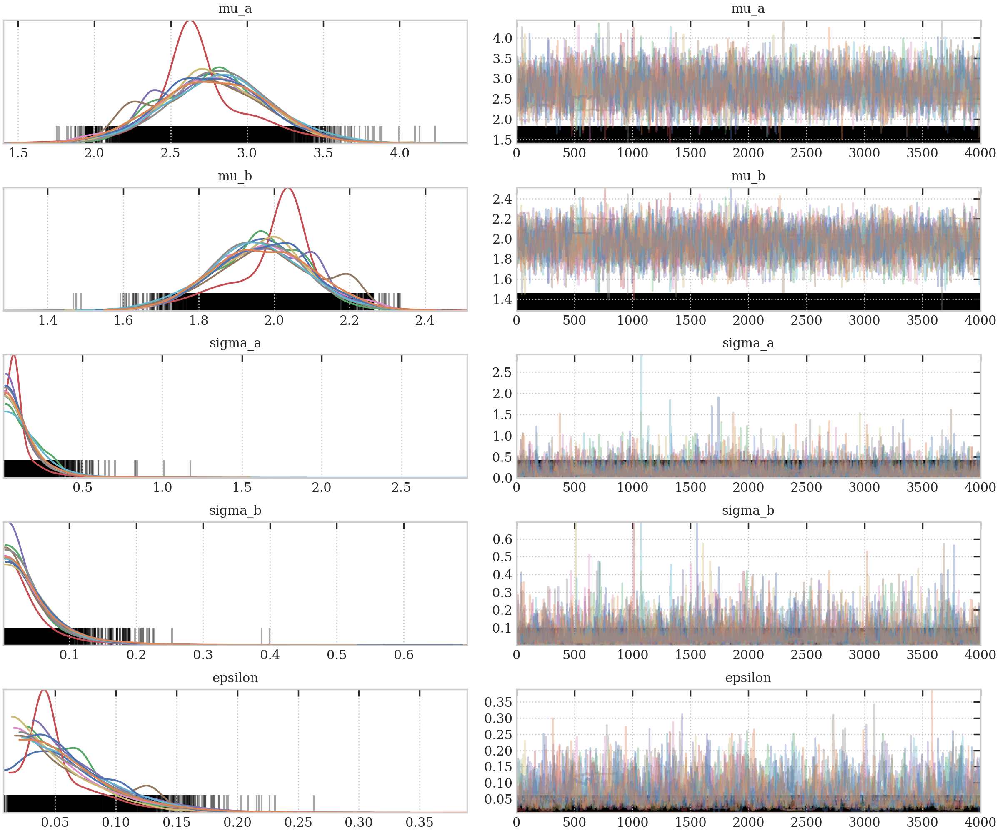

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x128a40748>,
      dtype=object)

In [35]:
pm.traceplot(trace_mass_radius_noise_hierarchical,['mu_a','mu_b','sigma_a','sigma_b','epsilon'])

<IPython.core.display.Javascript object>


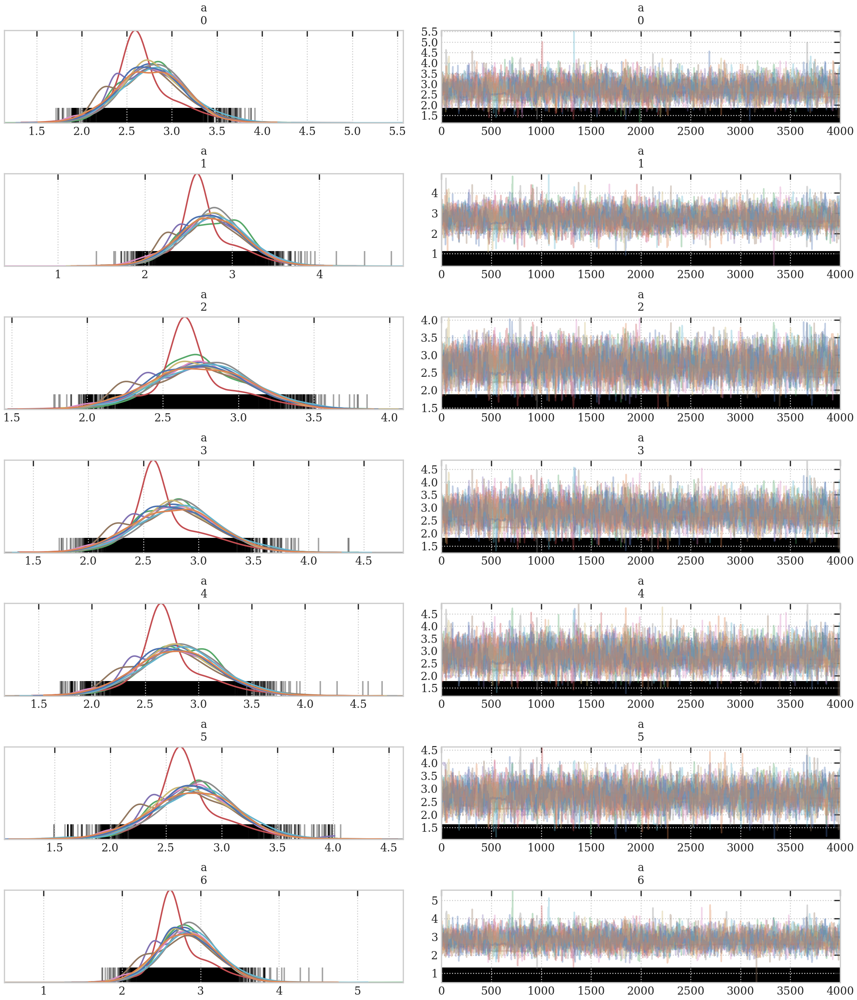

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x11db18828>,
      dtype=object)

In [36]:
pm.traceplot(trace_mass_radius_noise_hierarchical,['a'])

Plotting

In [201]:
trace_mass_radius,model_mass_radius = load_traces('mass_radius_complete_pooling')
trace_mass_radius_noise_hierarchical, model_mass_radius_noise_hierarchical = load_traces('mass_radius_hierarchical')

<IPython.core.display.Javascript object>


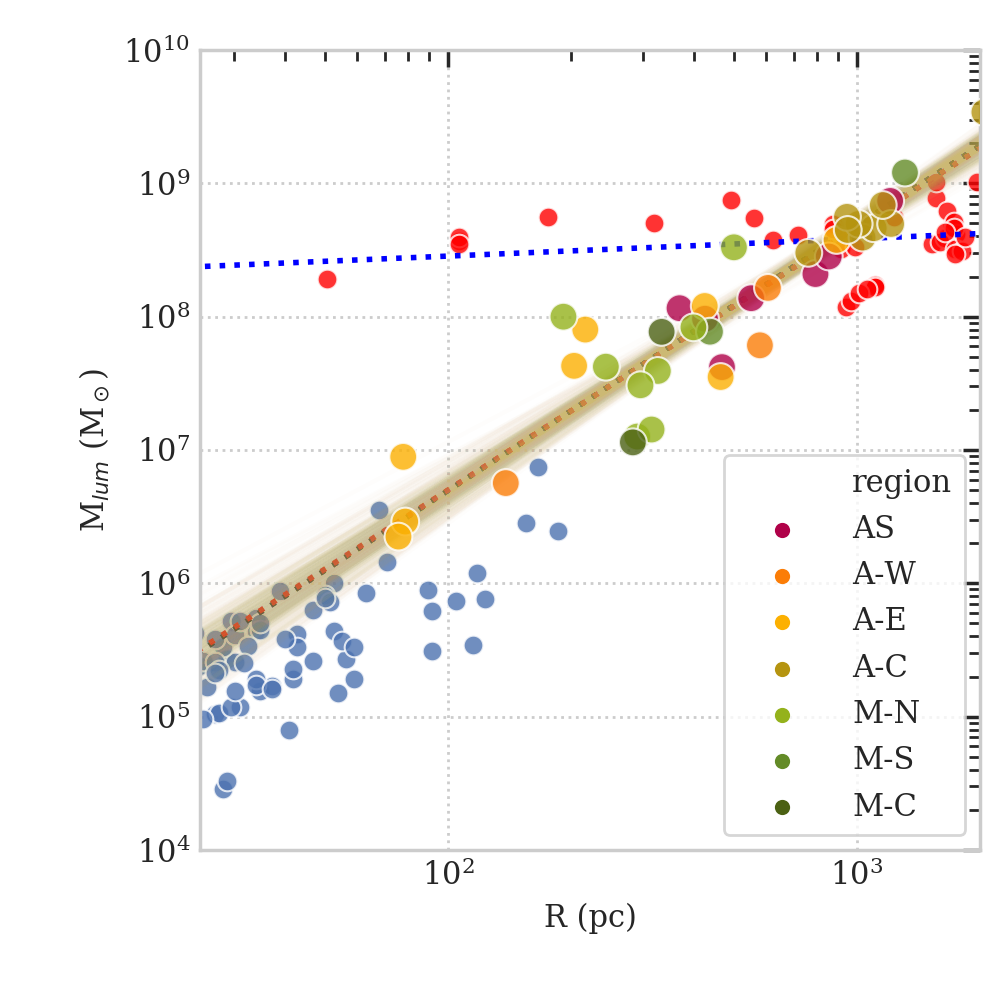

alpha = 2.72, beta = 1.988037, epsilon = 0.068205
alpha = 2.76, beta = 1.970328, epsilon = 0.058749
alpha = 8.19, beta = 0.129811, epsilon = 0.253785


In [37]:
ax = plot_data_mass_radius()
print_results(trace_mass_radius,ax,color='k')
print_results(trace_mass_radius_noise_hierarchical,ax,color='red')
print_results(trace_mass_radius_noise,ax,color='blue')

for i in range(0, len(lm.chain), 25):
    log_ys = lm.chain[i]['alpha'] + log_xs * lm.chain[i]['beta']
    ax.plot(10**log_xs, 10**log_ys, color='y', alpha=0.02)

**Final plot**

<IPython.core.display.Javascript object>


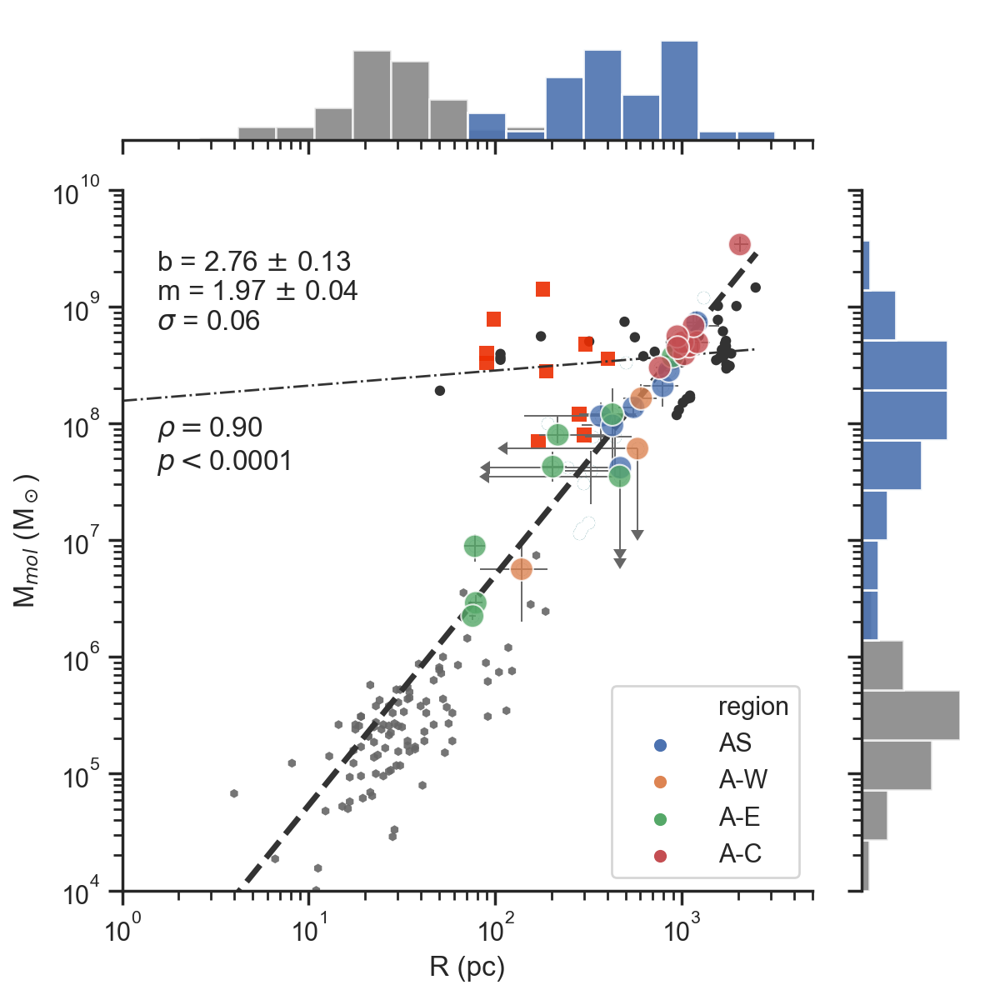

In [270]:
sns.set(style="ticks", color_codes=True)

# Global plot,
g = sns.JointGrid("R", "Mass_mol", data=all_data, space=0.5)

## Main plot
g = g.plot_joint(plt.scatter, color="#005f6a")

# Axes
g.ax_joint.set_yscale('log')
g.ax_joint.set_xscale('log')
g.ax_joint.set_xlim(1e0,5e3)
g.ax_joint.set_ylim(1e4,1e10)

## Main plot
g = g.plot_joint(plt.scatter, color='white')

# per region
#sns.scatterplot('R','Mass_mol',data=all_data[:-10], hue='region', palette=cmap[:-3],zorder=10,s=100, alpha=0.8, ax = g.ax_joint)
sns.scatterplot('R','Mass_mol',data=all_data[:-12], hue='region',zorder=10,s=100, alpha=0.8, ax = g.ax_joint)

# error bars
for reg in all_data[:-10].groupby('region'):
    d = reg[1]
    upper = d.radius_not_corrected == 1
    xerr_low = d['R_lerr']
    xerr_low[upper] = 0.8 * d['R'][upper]
    yerr_low = d['Mass_mol_lerr']
    yerr_low[upper] = 0.8 * d['Mass_mol'][upper]
    g.ax_joint.errorbar(x=d['R'],y=d['Mass_mol'],
                        xerr=[xerr_low,d['R_uerr']],yerr=[yerr_low,d['Mass_mol_uerr']],
                        xuplims = upper, uplims = upper,
                        ecolor='0.4',elinewidth=0.7,linestyle='',capthick=0)
    
# Add noise points and fit
sns.scatterplot('R','Mass_mol',data=as1063_noise,s=20, color='0.2', ax = g.ax_joint,marker='o',edgecolor='None',legend=False)
sns.scatterplot('R','Mass_mol',data=a521_noise,s=20, color='0.2', ax = g.ax_joint,marker='o',edgecolor='None',legend=False)
sns.scatterplot('R','Mass_mol',data=m1206_noise,s=20, color='0.2', ax = g.ax_joint,marker='o',edgecolor='None',legend=False)
g.ax_joint.plot(10**log_xs, 
                10**(trace_mass_radius_noise.get_values('intercept').mean() + trace_mass_radius_noise.get_values('gradient').mean()*log_xs), 
                color='0.2', alpha=1, linewidth=1,linestyle='-.') 
   
## Add Bolatto
sns.scatterplot(10**bolatto['logR'],10**bolatto['logMl'],s=15, color='0.4', ax = g.ax_joint,marker='h',edgecolor='None',alpha=0.9,legend=False)

## Add Swinbank
sns.scatterplot(swinbank['size'],swinbank['mass'],s=40, color='#ec2d01', ax = g.ax_joint,marker='s',edgecolor='None',alpha=0.9,legend=False)


## Marginals
_ = g.ax_marg_y.hist(10**bolatto['logMl'],orientation="horizontal", bins=np.logspace(4,10,15), alpha=0.7,color='0.4',weights=np.ones_like(bolatto['logMl'])*0.3)
_ = g.ax_marg_x.hist(10**bolatto['logR'], bins=np.logspace(0,3.5,18),alpha=0.7,color='0.4',weights=np.ones_like(bolatto['logMl'])*0.3)

_ = g.ax_marg_y.hist(np.array(all_data['Mass_mol'].values),orientation="horizontal", bins=np.logspace(4,10,15), alpha=0.9)
_ = g.ax_marg_x.hist(np.array(all_data['R'].values), bins=np.logspace(0,3.5,18),alpha=0.9)

 
def final_plot(trace,ax,color='k',Print=True):
    mean_intercept = trace.get_values('mu_a').mean()
    unc_intercept = trace.get_values('sigma_a').mean()
    mean_gradient = trace.get_values('mu_b').mean()
    unc_gradient = trace.get_values('sigma_b').mean()
    ax.plot(10**log_xs, 10**(mean_intercept + mean_gradient*log_xs), color=color, alpha=1, label='Normal likelihood',linewidth=2.5,linestyle='--') 
    ax.annotate('b = %0.2f $\pm$ %0.2f\nm = %0.2f $\pm$ %0.2f\n$\sigma$ = %0.2f'
                %(mean_intercept,unc_intercept,
                  mean_gradient,unc_gradient,
                  trace.get_values('epsilon').mean()),
                xy=(0.05, 0.80), xycoords=ax.transAxes)
  
    
final_plot(trace_mass_radius_noise_hierarchical,g.ax_joint,color='0.2')

'''## Typical surface birghtness
def mass(surface_density,r):
    return surface_density*r**2

g.ax_joint.plot(10**log_xs,mass(1000,10**log_xs),linestyle=':',color='red')
g.ax_joint.plot(10**log_xs,mass(2600,10**log_xs),linestyle=':',color='red')'''

# Labels
g.ax_joint.set_xlabel('R (pc)')
g.ax_joint.set_ylabel('M$_{mol}$ (M$_\odot$)')

## Add correlation
rho, p = spearmanr(all_data['R'].values,all_data['Mass_mol'].values)
ax = g.ax_joint 
ax.annotate('$\\rho=$%0.2f\n$p<$0.0001'%rho,xy=(0.05, 0.60), xycoords=ax.transAxes)

g.savefig('../Plots/larson_mass_radius_no_snake.png')

## Sigma vs size

Prepare data

In [44]:
# Prepare the data
data_x = np.log10(all_data['R'])
data_y = np.log10(all_data['line_width'])
uncertainty_x = np.mean((all_data['R_lerr'],all_data['R_uerr']),axis=0)/all_data['R']
uncertainty_y = all_data['line_width_unc']/all_data['line_width']
log_x_radius = np.log10(np.logspace(0,3.4,10))

noise_x = np.log10(all_noise['R'])
noise_y = np.log10(all_noise['line_width'])

def plot_data_sigma_size():
    fig, ax = plt.subplots(1,1,figsize=(5,5))
    fig.subplots_adjust(left=0.2, right=0.98, bottom=0.15, top=0.95)
    
    sns.scatterplot('R','line_width',data=all_data, hue='region',
                palette=cmap,zorder=10,s=100, alpha=0.8, ax = ax)
    sns.scatterplot('R','line_width',data=all_noise, s=50, 
                    alpha=0.8, ax = ax)
    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_xlim(-10,2000)
    #ax.set_ylim(1e6,1e10)
    ax.set_xlabel('R (pc)')
    ax.set_ylabel('$\sigma_v$ (kms$^{-1}$)')
    
    return ax    

Fit with linmix

<IPython.core.display.Javascript object>


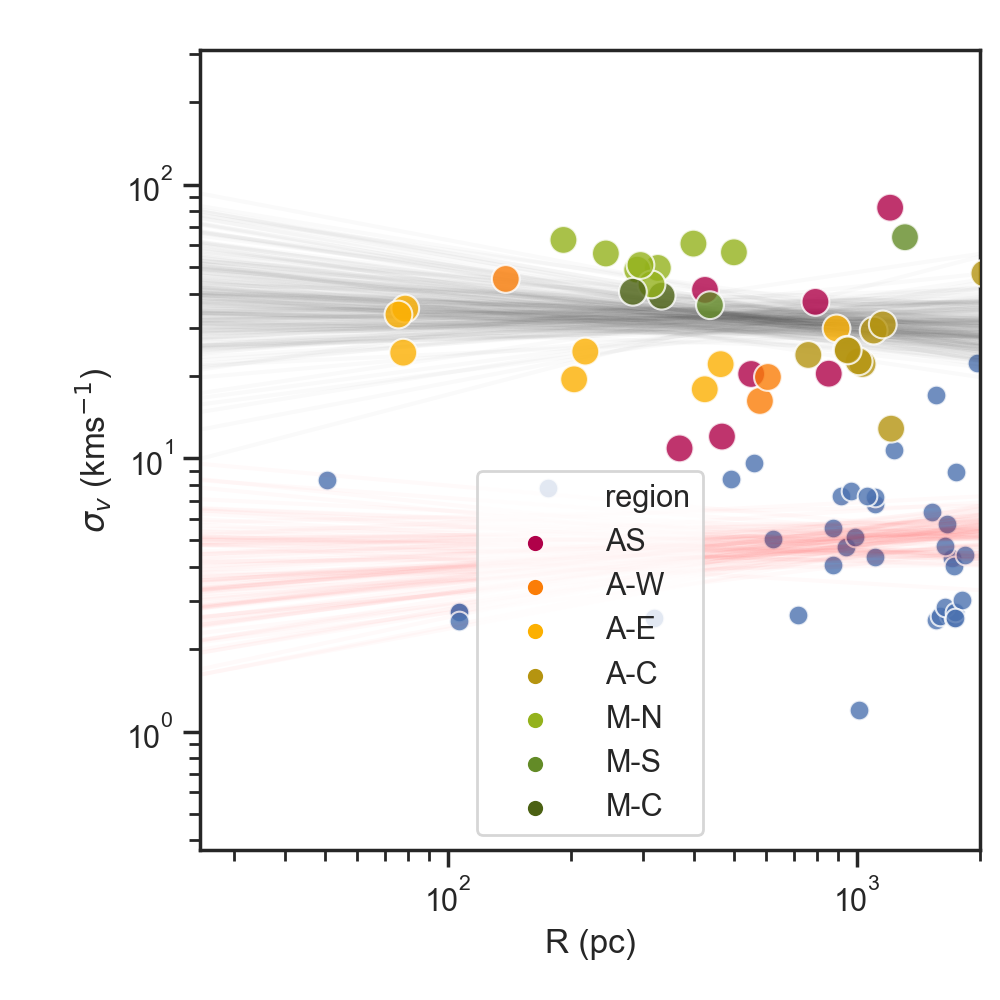

Data: alpha = 1.64, beta = -0.049929, epsilon = 0.045938
Noise: alpha = 0.45, beta = 0.081652, epsilon = 0.086485


In [45]:
lm = linmix.LinMix(data_x, data_y, uncertainty_x, uncertainty_y, K=2)
lm.run_mcmc(silent=True)

ax = plot_data_sigma_size()
for i in range(0, len(lm.chain), 50):
    log_ys = lm.chain[i]['alpha'] + log_x_radius * lm.chain[i]['beta']
    ax.plot(10**log_x_radius, 10**log_ys, color='k', alpha=0.02)

print('Data: alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(lm.chain['alpha'].mean(),lm.chain['beta'].mean(),lm.chain['sigsqr'].mean()))


### Noise ####
lm_noise = linmix.LinMix(noise_x, noise_y, K=2)
lm_noise.run_mcmc(silent=True)

for i in range(0, len(lm_noise.chain), 100):
    log_ys = lm_noise.chain[i]['alpha'] + log_x_radius * lm_noise.chain[i]['beta']
    ax.plot(10**log_x_radius, 10**log_ys, color='red', alpha=0.02)

print('Noise: alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(lm_noise.chain['alpha'].mean(),lm_noise.chain['beta'].mean(),lm_noise.chain['sigsqr'].mean()))

<IPython.core.display.Javascript object>


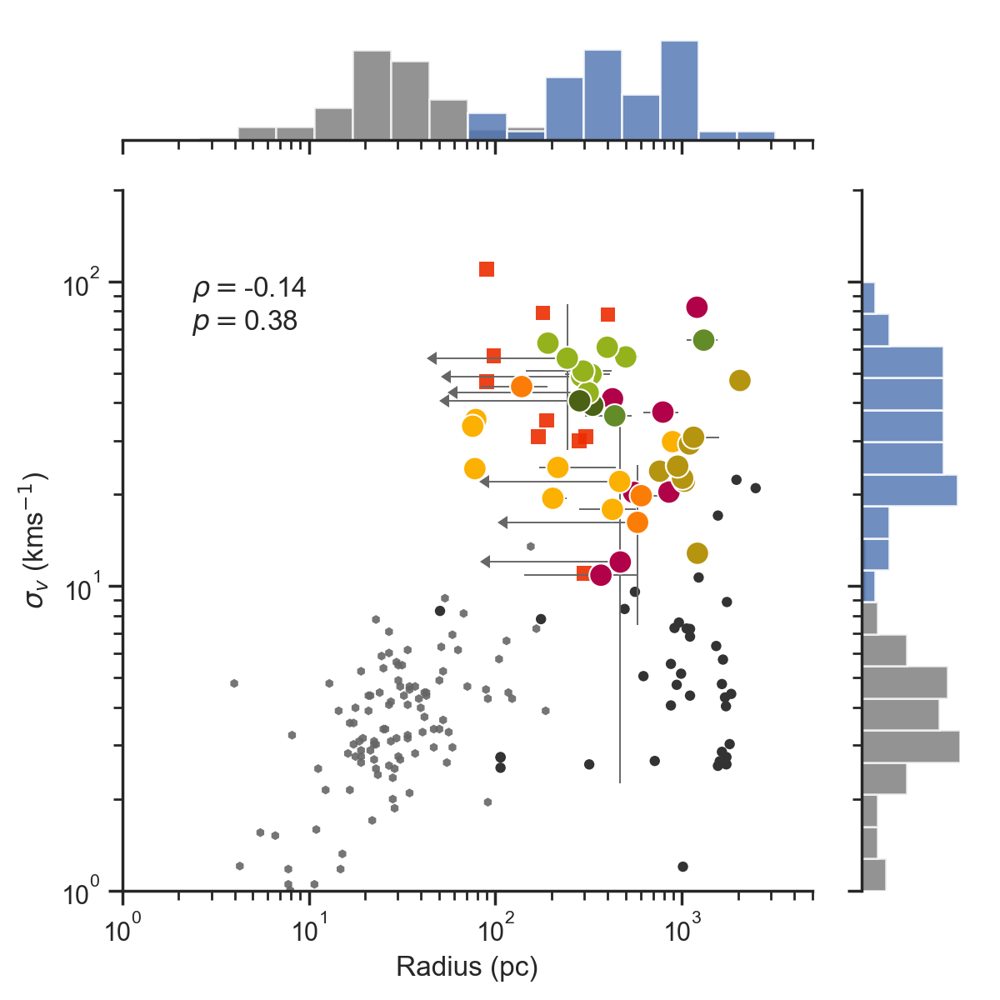

In [118]:
sns.set(style="ticks", color_codes=True)

# Global plot
g = sns.JointGrid("R", "line_width", data=all_data, space=0.5)

## Main plot
g = g.plot_joint(plt.scatter, color="#005f6a")

# Axes
g.ax_joint.set_yscale('log')
g.ax_joint.set_xscale('log')
g.ax_joint.set_xlim(1e0,5e3)
g.ax_joint.set_ylim(1e0,200)

## Main plot
g = g.plot_joint(plt.scatter, color='white')

# per region
sns.scatterplot('R','line_width',data=all_data, hue='region', palette=cmap,zorder=10,s=100, ax = g.ax_joint,legend=False)

# error bars
for reg in all_data.groupby('region'):
    d = reg[1]
    upper = d.radius_not_corrected == 1
    #### TEST ###
    xerr_low = d['R_lerr']
    xerr_low[upper] = 0.8 * d['R'][upper]
    ##############
    g.ax_joint.errorbar(x=d['R'],y=d['line_width'],
                        xerr=[xerr_low,d['R_uerr']],yerr=d['line_width_unc'],
                        xuplims = upper,
                        ecolor='0.4',elinewidth=0.7,linestyle='',capthick=0)
    

# Add noise points and fit
sns.scatterplot('R','line_width',data=as1063_noise, s=20, color='0.2', ax = g.ax_joint,marker='o',edgecolor='None',legend=False)
sns.scatterplot('R','line_width',data=a521_noise, s=20, color='0.2', ax = g.ax_joint,marker='o',edgecolor='None',legend=False)
sns.scatterplot('R','line_width',data=m1206_noise, s=20, color='0.2', ax = g.ax_joint,marker='o',edgecolor='None',legend=False)
   

## Marginals
_ = g.ax_marg_y.hist(10**bolatto['logS'],orientation="horizontal", bins=np.logspace(0,2,20), alpha=0.7,color='0.4',weights=np.ones_like(bolatto['logMl'])*0.3)
_ = g.ax_marg_x.hist(10**bolatto['logR'], bins=np.logspace(0,3.5,18),alpha=0.7,color='0.4',weights=np.ones_like(bolatto['logMl'])*0.3)

_ = g.ax_marg_y.hist(np.array(all_data['line_width'].values),orientation="horizontal", bins=np.logspace(0,2,20), alpha=0.8)
_ = g.ax_marg_x.hist(np.array(all_data['R'].values), bins=np.logspace(0,3.5,18),alpha=0.8)


## Add correlation
rho, p = spearmanr(all_data['R'].values,all_data['line_width'].values)
ax = g.ax_joint 
ax.annotate('$\\rho=$%0.2f\n$p=$%0.2f'%(rho,p),xy=(0.10, 0.80), xycoords=ax.transAxes)
    
    
## Add Larson
def Lars_sigma_size(size):
    return 1.10*size**0.5
Lars_sizes = np.arange(0.1,3100,10)
Lars_sigmas = Lars_sigma_size(Lars_sizes)

#g.ax_joint.plot(Lars_sizes,Lars_sigmas,color='#be0119')
#ax.annotate('r$^{0.5}$',xy=(0.05, 0.15),rotation=34, xycoords=ax.transAxes,color='#be0119')


## Add Bolatto
sns.scatterplot(10**bolatto['logR'],10**bolatto['logS'],s=15, color='0.4', ax = g.ax_joint,marker='h',edgecolor='None',alpha=0.9,legend=False)

## Add Swinbank
sns.scatterplot(swinbank['size'],swinbank['line_width'],s=40, color='#ec2d01', ax = g.ax_joint,marker='s',edgecolor='None',alpha=0.9,legend=False)


# Labels
g.ax_joint.set_xlabel('Radius (pc)')
g.ax_joint.set_ylabel('$\sigma_v$ (kms$^{-1}$)')

g.savefig('../Plots/larson_sigma_radius.png')

In [269]:
all_data[['region','radius_pc','line_width']].groupby('region').corr('spearman')

line_width  radius_pc
region                                  
A-C    line_width    1.000000   0.250000
       radius_pc     0.250000   1.000000
A-E    line_width    1.000000  -0.357143
       radius_pc    -0.357143   1.000000
A-W    line_width    1.000000  -0.500000
       radius_pc    -0.500000   1.000000
AS     line_width    1.000000   0.607143
       radius_pc     0.607143   1.000000
M-C    line_width    1.000000  -1.000000
       radius_pc    -1.000000   1.000000
M-N    line_width    1.000000  -0.047619
       radius_pc    -0.047619   1.000000
M-S    line_width    1.000000   1.000000
       radius_pc     1.000000   1.000000

Not really a good relation. Maybe something wrong with the snake?

## Sigma vs mass

In [ ]:
Prepare data

In [185]:
# Prepare the data
data_x = np.log10(all_data['Mass_mol'])
data_y = np.log10(all_data['line_width'])
uncertainty_x = np.mean((all_data['Mass_mol_lerr'],all_data['Mass_mol_uerr']),axis=0)/all_data['Mass_mol']
uncertainty_y = all_data['line_width_unc']/all_data['line_width']
log_xs = np.log10(np.logspace(6,10,10))

noise_x = np.log10(all_noise['Mass_mol'])
noise_y = np.log10(all_noise['line_width'])

def plot_data_sigma_size():
    fig, ax = plt.subplots(1,1,figsize=(5,5))
    fig.subplots_adjust(left=0.2, right=0.98, bottom=0.15, top=0.95)
    
    sns.scatterplot('Mass_mol','line_width',data=all_data, hue='region',
                palette=cmap,zorder=10,s=100, alpha=0.8, ax = ax)
    sns.scatterplot('Mass_mol','line_width',data=all_noise, s=50, 
                    alpha=0.8, ax = ax)
    
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_xlim(1e6,1e10)
    ax.set_ylim(1e0,200)
    ax.set_xlabel('M$_{lum}$ (M$_\odot$')
    ax.set_ylabel('$\sigma_v$ (kms$^{-1}$')
    
    return ax    

Fit with linmix

<IPython.core.display.Javascript object>


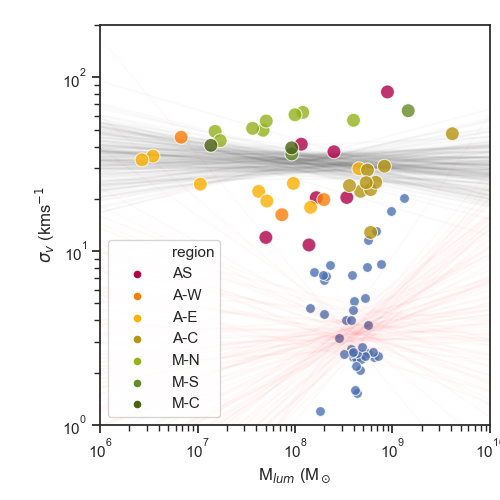

Linmix - Complete pooling: alpha = 1.65, beta = -0.017190, epsilon = 0.046434
Linmix - Complete pooling: alpha = -0.45, beta = 0.113486, epsilon = 0.151297


In [186]:
lm = linmix.LinMix(data_x, data_y, uncertainty_x, uncertainty_y, K=2)
lm.run_mcmc(silent=True)

ax = plot_data_sigma_size()
for i in range(0, len(lm.chain), 50):
    log_ys = lm.chain[i]['alpha'] + log_xs * lm.chain[i]['beta']
    ax.plot(10**log_xs, 10**log_ys, color='k', alpha=0.02)

print('Linmix - Complete pooling: alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(lm.chain['alpha'].mean(),lm.chain['beta'].mean(),lm.chain['sigsqr'].mean()))


### Noise ####
lm_noise = linmix.LinMix(noise_x, noise_y, K=2)
lm_noise.run_mcmc(silent=True)

for i in range(0, len(lm_noise.chain), 100):
    log_ys = lm_noise.chain[i]['alpha'] + log_xs * lm_noise.chain[i]['beta']
    ax.plot(10**log_xs, 10**log_ys, color='red', alpha=0.02)

print('Linmix - Complete pooling: alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(lm_noise.chain['alpha'].mean(),lm_noise.chain['beta'].mean(),lm_noise.chain['sigsqr'].mean()))

<IPython.core.display.Javascript object>


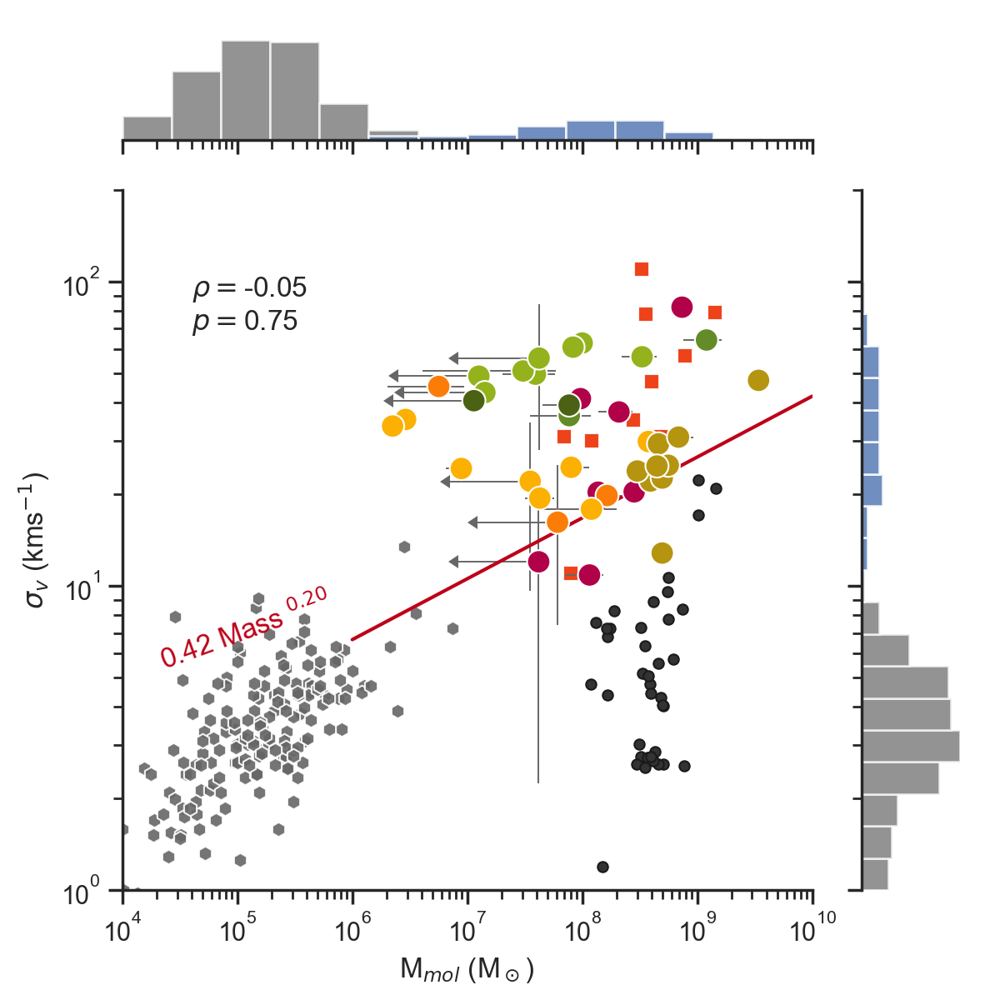

In [109]:
sns.set(style="ticks", color_codes=True)

# Global plot
g = sns.JointGrid("Mass_mol", "line_width", data=all_data, space=0.5)

## Main plot
g = g.plot_joint(plt.scatter, color="#005f6a")

# per region
sns.scatterplot('Mass_mol','line_width',data=all_data, hue='region',
                palette=cmap,zorder=10,s=100, ax = g.ax_joint, legend=False)

    
for reg in all_data.groupby('region'):
    d = reg[1]
    upper = d.radius_not_corrected == 1
    #### TEST ###
    xerr_low = d['Mass_mol_lerr']
    xerr_low[upper] = 0.8 * d['Mass_mol'][upper]
    ##############
    g.ax_joint.errorbar(x=d['Mass_mol'],y=d['line_width'],
                        xerr=[xerr_low,d['Mass_mol_uerr']],yerr=d['line_width_unc'],
                        xuplims = upper,
                        ecolor='0.4',elinewidth=0.7,linestyle='',capthick=0)    
    
## Marginals
_ = g.ax_marg_y.hist(10**bolatto['logS'],orientation="horizontal", bins=np.logspace(0,2,20), alpha=0.7,color='0.4')
_ = g.ax_marg_x.hist(10**bolatto['logMl'], bins=np.logspace(4,10,15),alpha=0.7,color='0.4')

_ = g.ax_marg_y.hist(np.array(all_data['line_width'].values),orientation="horizontal", bins=np.logspace(0,2,20), alpha=0.8)
_ = g.ax_marg_x.hist(np.array(all_data['Mass_mol'].values),alpha=0.8,bins=np.logspace(4,10,15))
 
    
# Add noise points and fit
sns.scatterplot('Mass_mol','line_width',data=as1063_noise, s=20, color='0.2', ax = g.ax_joint,marker='o',edgecolor='0.1',legend=False)
sns.scatterplot('Mass_mol','line_width',data=a521_noise,   s=20, color='0.2', ax = g.ax_joint,marker='o',edgecolor='0.1',legend=False)
sns.scatterplot('Mass_mol','line_width',data=m1206_noise,  s=20, color='0.2', ax = g.ax_joint,marker='o',edgecolor='0.1',legend=False)

## Add correlation
rho, p = spearmanr(all_data['Mass_mol'].values,all_data['line_width'].values)
ax = g.ax_joint 
ax.annotate('$\\rho=$%0.2f\n$p=$%0.2f'%(rho,p),xy=(0.10, 0.80), xycoords=ax.transAxes)


## Add Larson
def Lars_sigma_mass(mass):
    return 0.42*mass**0.20
Lars_masses = np.arange(1e6,1e10,1e6)
Lars_sigmas = Lars_sigma_mass(Lars_masses)

g.ax_joint.plot(Lars_masses,Lars_sigmas,color='#be0119')
ax.annotate('0.42 Mass $^{0.20}$',xy=(0.05, 0.40),rotation=20, xycoords=ax.transAxes,color='#be0119')


## Add Bolatto
sns.scatterplot(10**bolatto['logMl'],10**bolatto['logS'],s=40, color='0.4', ax = g.ax_joint,marker='h',edgecolor='w',alpha=0.9,legend=False)

## Add Swinbank
sns.scatterplot(swinbank['mass'],swinbank['line_width'],s=40, color='#ec2d01', ax = g.ax_joint,marker='s',edgecolor='w',alpha=0.9,legend=False)

# Axes
g.ax_joint.set_xscale('log')
g.ax_joint.set_yscale('log')
g.ax_joint.set_xlim(1e4,1e10)
g.ax_joint.set_ylim(1e0,200)
g.ax_joint.set_xlabel('M$_{mol}$ (M$_\odot$)')
g.ax_joint.set_ylabel('$\sigma_v$ (kms$^{-1}$)')

g.savefig('../Plots/larson_mass_sigma.png')

## Internal pressure 

<IPython.core.display.Javascript object>


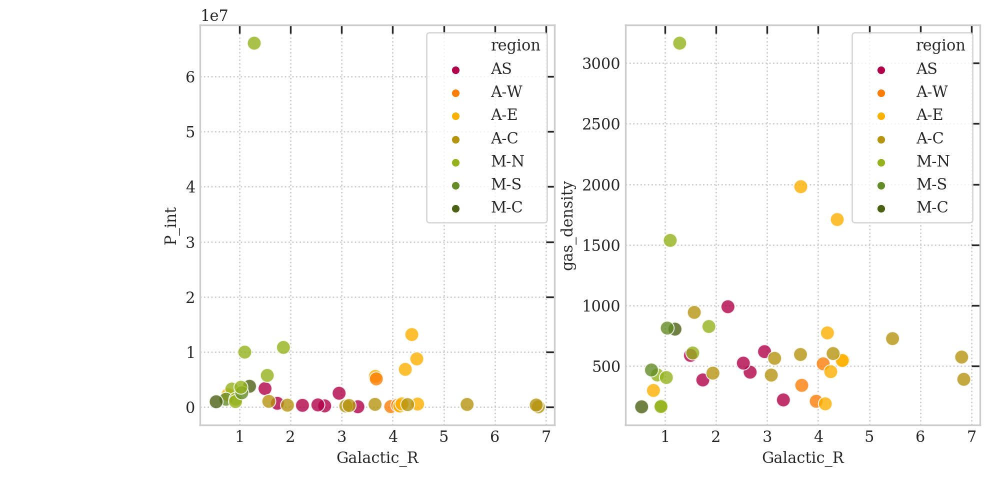

In [216]:
# Prepare the data
fig, ax = plt.subplots(1,2,figsize=(10,5))
fig.subplots_adjust(left=0.2, right=0.98, bottom=0.15, top=0.95)

sns.scatterplot('Galactic_R','P_int',data=all_data, hue='region', palette=cmap,zorder=10,s=100, alpha=0.8, ax = ax[0])
sns.scatterplot('Galactic_R','gas_density',data=all_data, hue='region', palette=cmap,zorder=10,s=100, alpha=0.8, ax = ax[1])

## Alpha_CO

are the clumps virialised?

<IPython.core.display.Javascript object>


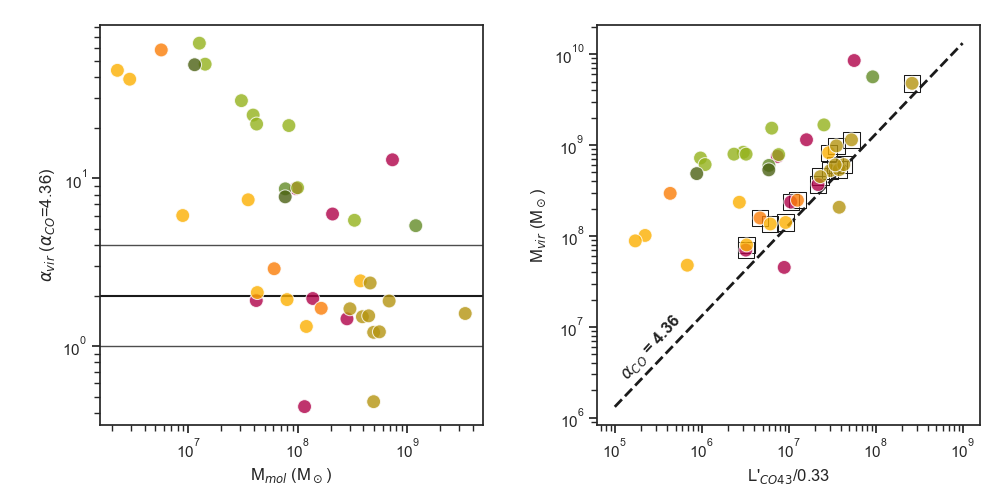

In [394]:
fig, ax = plt.subplots(1,2,figsize=(10,5))
fig.subplots_adjust(left=0.1, right=0.98, wspace=0.3, bottom=0.15, top=0.95)


sns.scatterplot('Mass_mol','vir_param',data=all_data, hue='region', palette=cmap, zorder=10,s=100, alpha=0.8, ax = ax[0],legend=False)

ax[0].axhline(2,color='k')
ax[0].axhline(1,color='0.3', linewidth=1)
ax[0].axhline(4,color='0.3', linewidth=1)

ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('M$_{mol}$ (M$_\odot$)')
ax[0].set_ylabel('$\\alpha_{vir}$ ($\\alpha_{CO}$=4.36)')

sns.scatterplot('Ll_CO43','Mass_vir',data=all_data, hue='region', palette=cmap, zorder=10,s=100, alpha=0.8, ax = ax[1],legend=False)
sns.scatterplot('Ll_CO43','Mass_vir',data=all_data[(all_data.vir_param > 1) & (all_data.vir_param < 4)], marker='s',edgecolor='k',facecolor='',s=140, ax = ax[1])

xaxis =np.logspace(5,9)
ax[1].plot(xaxis, xaxis*4.36/0.33,linestyle='--',color='k',linewidth=2)
ax[1].annotate('$\\alpha_{CO}$ = 4.36',xy=(0.05,0.25),rotation=48,fontweight='bold',xycoords='axes fraction')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_ylabel('M$_{vir}$ (M$_\odot$)')
ax[1].set_xlabel("L'$_{CO43}$/0.33")

fig.savefig('../Plots/alpha_co.png')

In [307]:
all_data.columns

Index(['Galactic_R', 'L_CO43', 'L_CO43_lerr', 'L_CO43_uerr', 'Ll_CO10',
       'Ll_CO43', 'Ll_CO43_lerr', 'Ll_CO43_uerr', 'Mass_mol', 'Mass_mol_lerr',
       'Mass_mol_uerr', 'Mass_stellar', 'Mass_stellar_lerr',
       'Mass_stellar_uerr', 'Mass_vir', 'Mass_vir_lerr', 'Mass_vir_uerr',
       'P_int', 'P_int_lerr', 'P_int_uerr', 'R', 'R_lerr', 'R_uerr', 'SFR',
       'SFR_unc', '_idx', 'area_exact_lerr', 'area_exact_uerr',
       'corrected_area', 'flux', 'flux_intrinsic', 'flux_intrinsic_lerr',
       'flux_intrinsic_uerr', 'flux_lerr', 'flux_uerr', 'gas_density',
       'gas_density_lerr', 'gas_density_uerr', 'line_width', 'line_width_unc',
       'met', 'met_unc', 'mlt_region', 'mu', 'mu_unc', 'radius_corrected',
       'radius_corrected_lerr', 'radius_corrected_uerr', 'radius_kpc',
       'radius_kpc_lerr', 'radius_kpc_uerr', 'radius_not_corrected', 'region',
       'vir_param', 'vir_param_lerr', 'vir_param_uerr'],
      dtype='object')

<IPython.core.display.Javascript object>


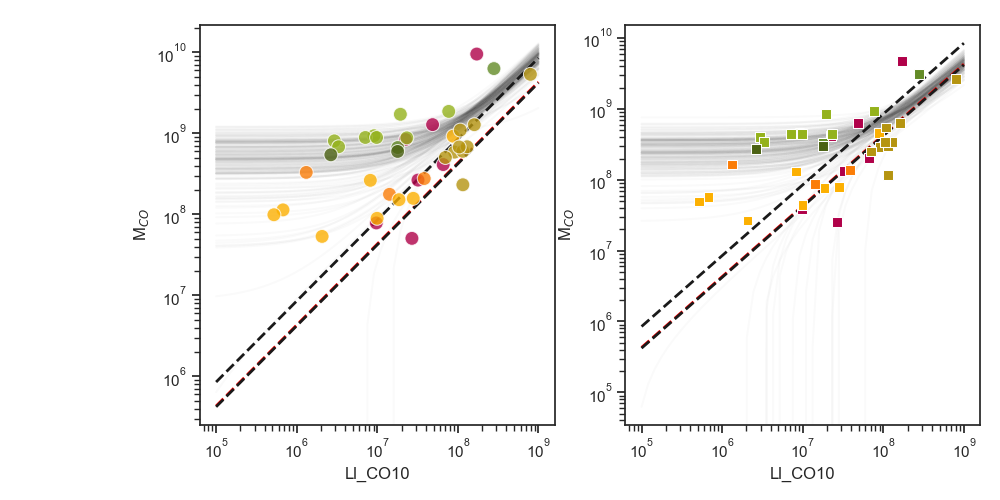

132712440000.0
Linmix - Complete pooling: alpha = 502300699.34, beta = 8.488810, epsilon = 2517839090100933632.000000
Linmix - Complete pooling: alpha = 251956067.07, beta = 4.262913, epsilon = 629625186190571904.000000


In [329]:
fig, ax = plt.subplots(1,2,figsize=(10,5))
fig.subplots_adjust(left=0.2, right=0.98, bottom=0.15, top=0.95)

alpha_vir = 1
from astropy.constants import G
from astropy import units as u
G_const = G.to(u.km**3/u.M_sun/u.s**2).value
print(G_const)

xs =np.logspace(5,9)
m_co = 5*all_data['line_width']**2*all_data['R']*u.pc.to(u.km)/(alpha_vir*G_const)
sns.scatterplot('Ll_CO10',m_co,data=all_data, hue='region', palette=cmap, 
                zorder=10,s=100, alpha=0.8, ax = ax[0],legend=False)

#### Fit linmix ####
lm = linmix.LinMix(all_data['Ll_CO10'], m_co, K=2)
lm.run_mcmc(silent=True)
for i in range(0, len(lm.chain), 50):
    ys = lm.chain[i]['alpha'] + xs * lm.chain[i]['beta']
    ax[0].plot(xs, ys, color='k', alpha=0.02)

print('Linmix - Complete pooling: alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(lm.chain['alpha'].mean(),lm.chain['beta'].mean(),lm.chain['sigsqr'].mean()))
########################


alpha_vir = 2
m_co = 5*all_data['line_width']**2*all_data['R']*u.pc.to(u.km)/(alpha_vir*G_const)
sns.scatterplot('Ll_CO10',m_co,data=all_data, hue='region', palette=cmap, 
                zorder=10,s=50, marker='s', ax = ax[1],legend=False)

#### Fit linmix ####
lm = linmix.LinMix(all_data['Ll_CO10'], m_co, K=2)
lm.run_mcmc(silent=True)
for i in range(0, len(lm.chain), 50):
    ys = lm.chain[i]['alpha'] + xs * lm.chain[i]['beta']
    ax[1].plot(xs, ys, color='k', alpha=0.02)

print('Linmix - Complete pooling: alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(lm.chain['alpha'].mean(),lm.chain['beta'].mean(),lm.chain['sigsqr'].mean()))
########################

for x in ax:
    x.plot(xaxis, xs*4.3,linestyle='--',color='red',linewidth=2)
    x.plot(xaxis, xs*8.5,linestyle='--',color='k',linewidth=2)
    x.plot(xaxis, xs*4.2,linestyle='--',color='k',linewidth=2)
    x.set_xscale('log')
    x.set_yscale('log')
    x.set_xlabel('Ll_CO10')
    x.set_ylabel('M$_{CO}$')

In [287]:
all_data.columns

Index(['Galactic_R', 'L_CO43', 'L_CO43_lerr', 'L_CO43_uerr', 'Ll_CO10',
       'Ll_CO43', 'Ll_CO43_lerr', 'Ll_CO43_uerr', 'Mass_mol', 'Mass_mol_lerr',
       'Mass_mol_uerr', 'Mass_stellar', 'Mass_stellar_lerr',
       'Mass_stellar_uerr', 'Mass_vir', 'Mass_vir_lerr', 'Mass_vir_uerr',
       'P_int', 'P_int_lerr', 'P_int_uerr', 'R', 'R_lerr', 'R_uerr', 'SFR',
       'SFR_unc', '_idx', 'area_exact_lerr', 'area_exact_uerr',
       'corrected_area', 'flux', 'flux_intrinsic', 'flux_intrinsic_lerr',
       'flux_intrinsic_uerr', 'flux_lerr', 'flux_uerr', 'gas_density',
       'gas_density_lerr', 'gas_density_uerr', 'line_width', 'line_width_unc',
       'met', 'met_unc', 'mlt_region', 'mu', 'mu_unc', 'radius_corrected',
       'radius_corrected_lerr', 'radius_corrected_uerr', 'radius_kpc',
       'radius_kpc_lerr', 'radius_kpc_uerr', 'radius_not_corrected', 'region',
       'vir_param', 'vir_param_lerr', 'vir_param_uerr'],
      dtype='object')

<IPython.core.display.Javascript object>


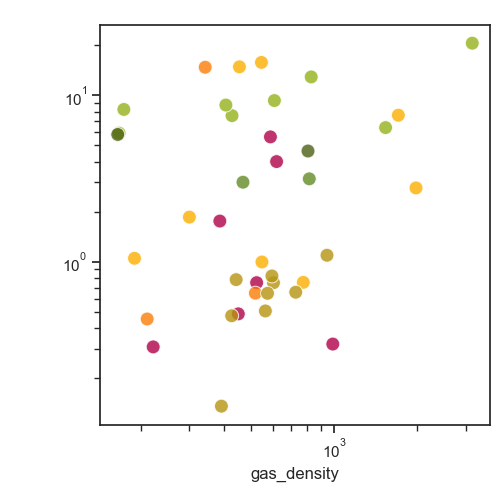

In [291]:
fig, ax = plt.subplots(1,1,figsize=(5,5))
fig.subplots_adjust(left=0.2, right=0.98, bottom=0.15, top=0.95)

c = all_data['line_width']**2/all_data['R']
sns.scatterplot('gas_density',c,data=all_data, hue='region', palette=cmap, 
                zorder=10,s=100, alpha=0.8, ax = ax,legend=False)

ax.set_xscale('log')
ax.set_yscale('log')

In [ ]:
FUn Fun Fun 

In [273]:
all_data.region.unique()

array(['AS', 'A-W', 'A-E', 'A-C', 'M-N', 'M-S', 'M-C'], dtype=object)

<IPython.core.display.Javascript object>


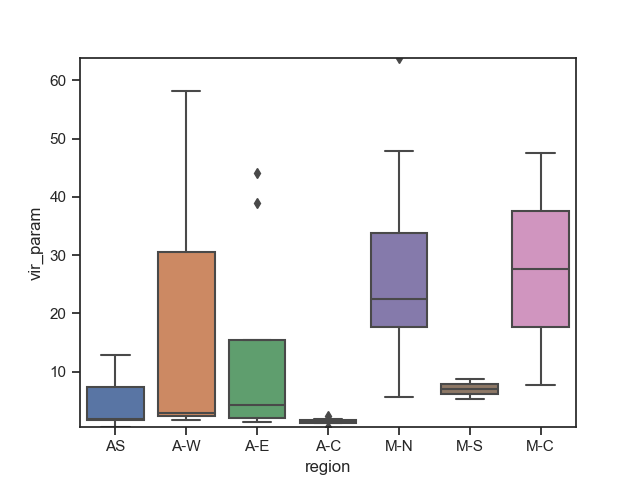

In [284]:
fig, ax = plt.subplots(1,1)
sns.boxplot(y="vir_param", x ='region', data=all_data)

In [ ]:
RE-DO THIS FOR EXTREME VALUES OF ALPHA


## Kennicutt-Schmidt law

In [238]:
# Prepare the data
data_x = np.log10(as1063['gas_density'])
data_y = np.log10(as1063['SFR'])
uncertainty_x = np.mean((as1063['gas_density_lerr'],as1063['gas_density_uerr']),axis=0)/as1063['gas_density']
uncertainty_y = as1063['SFR_unc']/as1063['SFR']
#log_xs = np.log10(np.logspace(0,3.4,10))


def plot_data_KS():
    
    fig, ax = plt.subplots(1,1,figsize=(5,5))
    fig.subplots_adjust(left=0.2, right=0.98, bottom=0.15, top=0.95)
    
    sns.scatterplot('gas_density','SFR',data=as1063, zorder=10,s=100, alpha=0.8, ax = ax)
    #sns.scatterplot('gas_density','met',data=as1063, zorder=10,s=100, alpha=0.8, ax = ax)

    for i in range(len(as1063)):
        ax.annotate('%d'%i,xy=(as1063.ix[i,'gas_density']*1.01,as1063.ix[i,'SFR']*1.01))
    
    #ax.set_yscale('log')
    #ax.set_xscale('log')
    #ax.set_xlim(-10,2000)
    #ax.set_ylim(1e4,1e10)
    ax.set_xlabel('$\Sigma_{mol}$ (M$_\odot$ pc$^{-2}$)')
    ax.set_ylabel('$\Sigma_{SFR}$ (M$_\odot$/yr)')
    return ax    

<IPython.core.display.Javascript object>


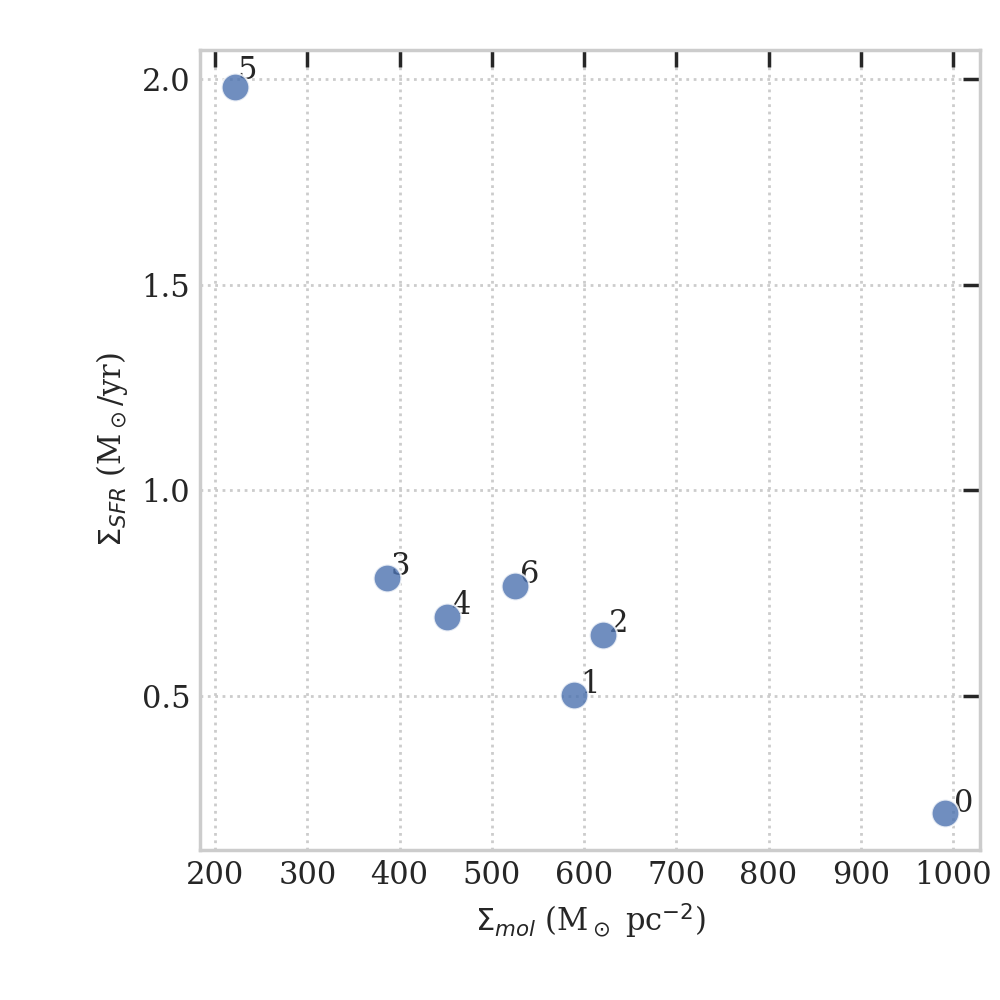

In [239]:
plot_data_KS()

<IPython.core.display.Javascript object>


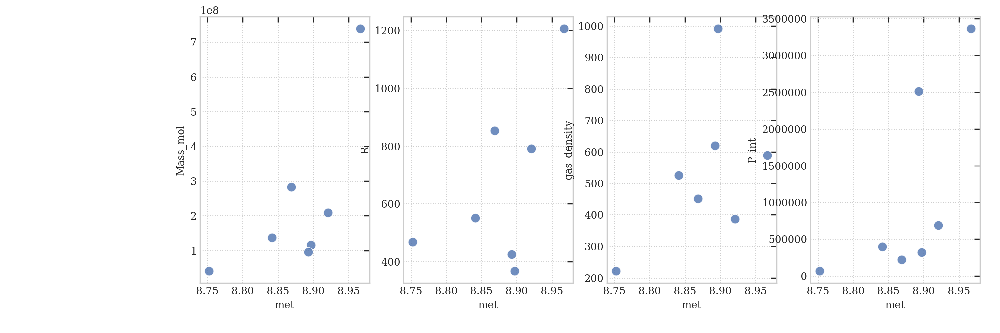

In [234]:
fig, ax = plt.subplots(1,4,figsize=(15,5))
fig.subplots_adjust(left=0.2, right=0.98, bottom=0.15, top=0.95)

sns.scatterplot('met','Mass_mol',data=as1063, zorder=10,s=100, alpha=0.8, ax = ax[0])
sns.scatterplot('met','R',data=as1063, zorder=10,s=100, alpha=0.8, ax = ax[1])
sns.scatterplot('met','gas_density',data=as1063, zorder=10,s=100, alpha=0.8, ax = ax[2])
sns.scatterplot('met','P_int',data=as1063, zorder=10,s=100, alpha=0.8, ax = ax[3])

<IPython.core.display.Javascript object>


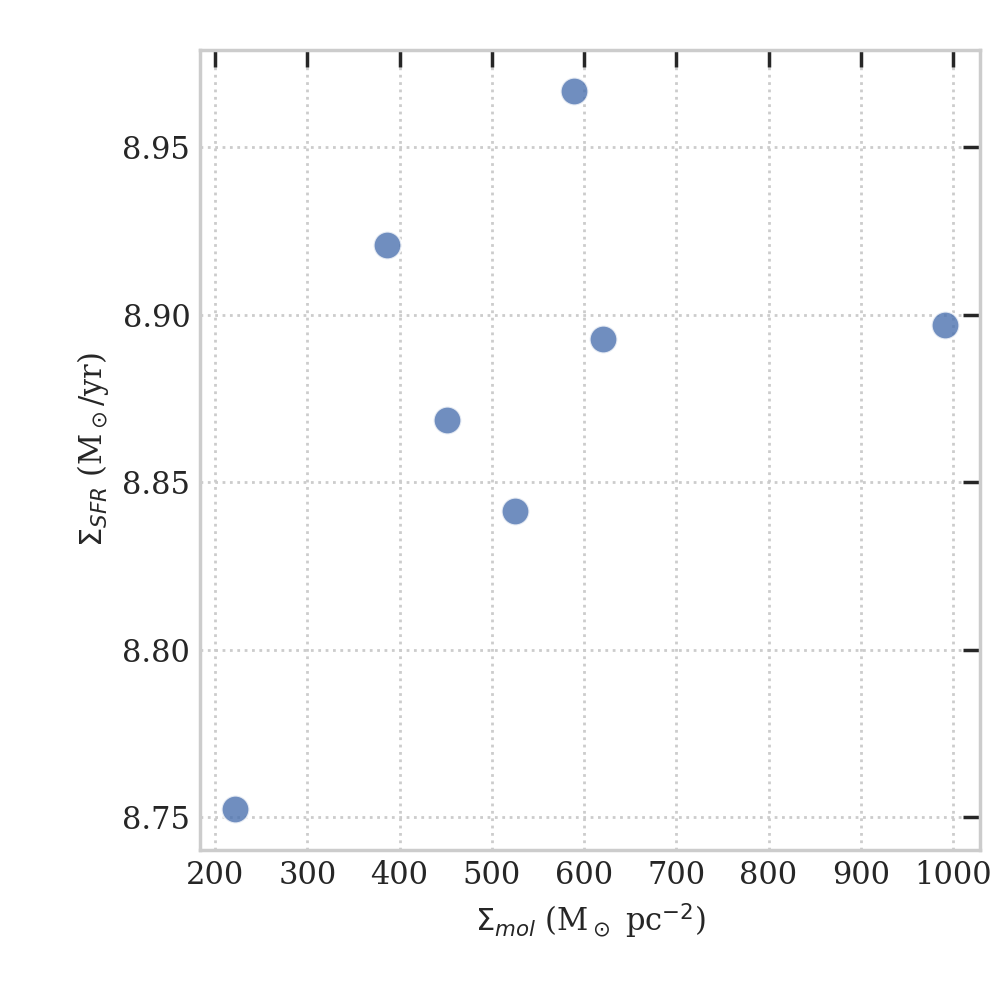

In [235]:
plot_data_KS()

Fit with linmin

<IPython.core.display.Javascript object>


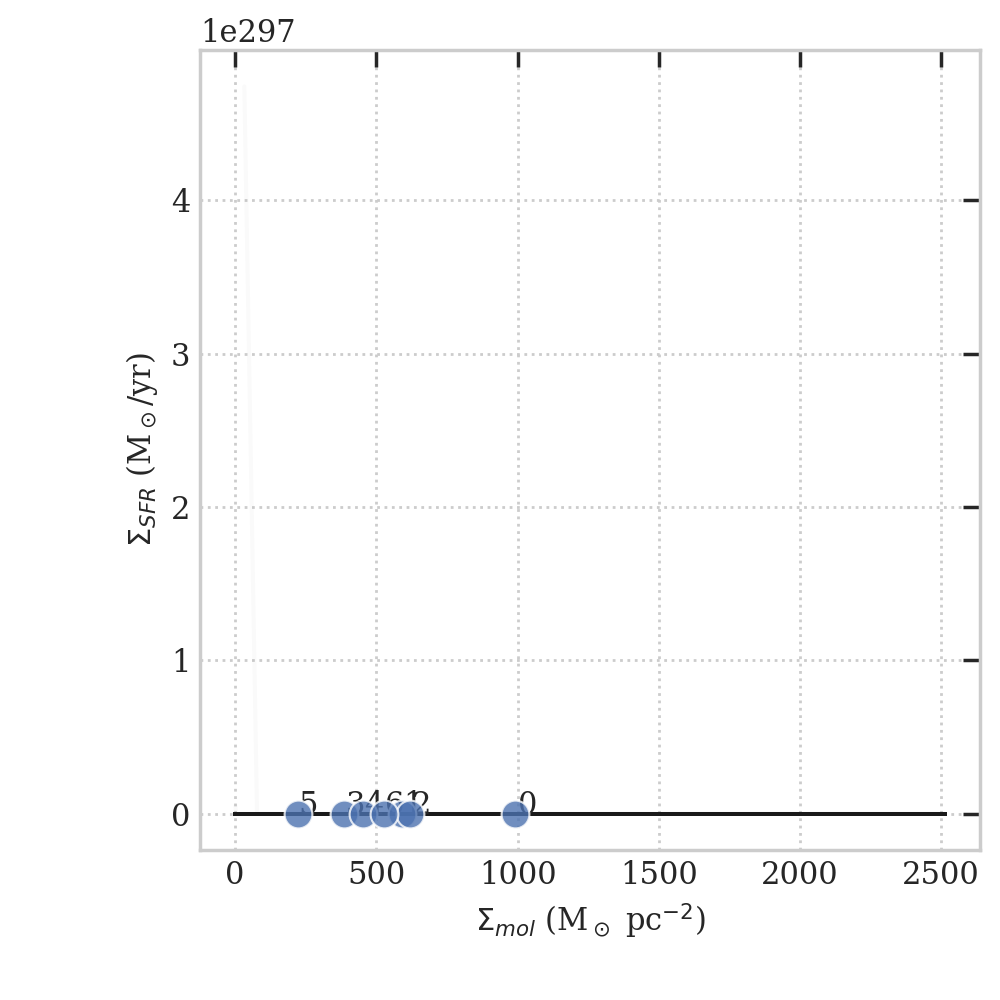

KS: alpha = 330.90, beta = -124.387928, epsilon = 2.325903


In [240]:
lm = linmix.LinMix(data_x, data_y, uncertainty_x, uncertainty_y, K=2)
lm.run_mcmc(silent=True)

ax = plot_data_KS()
for i in range(0, len(lm.chain), 50):
    log_ys = lm.chain[i]['alpha'] + log_xs * lm.chain[i]['beta']
    ax.plot(10**log_xs, 10**log_ys, color='k', alpha=0.02)

print('KS: alpha = %0.2f, beta = %0.6f, epsilon = %0.6f'%(lm.chain['alpha'].mean(),lm.chain['beta'].mean(),lm.chain['sigsqr'].mean()))

## alpha_CO factor

### Are clumps virialised?

In [99]:
colours =['#ffad01','#f97306','#e50000','#c20078', '#80013f','#01386a','#047495','#1fa774', '#3f9b0b']

as1063_color = colours[3]
a521_color = colours[0]
m1206_color = colours[6]

a521_pallete = colours[0:3]
m1206_pallete = colours[5:8]

<IPython.core.display.Javascript object>


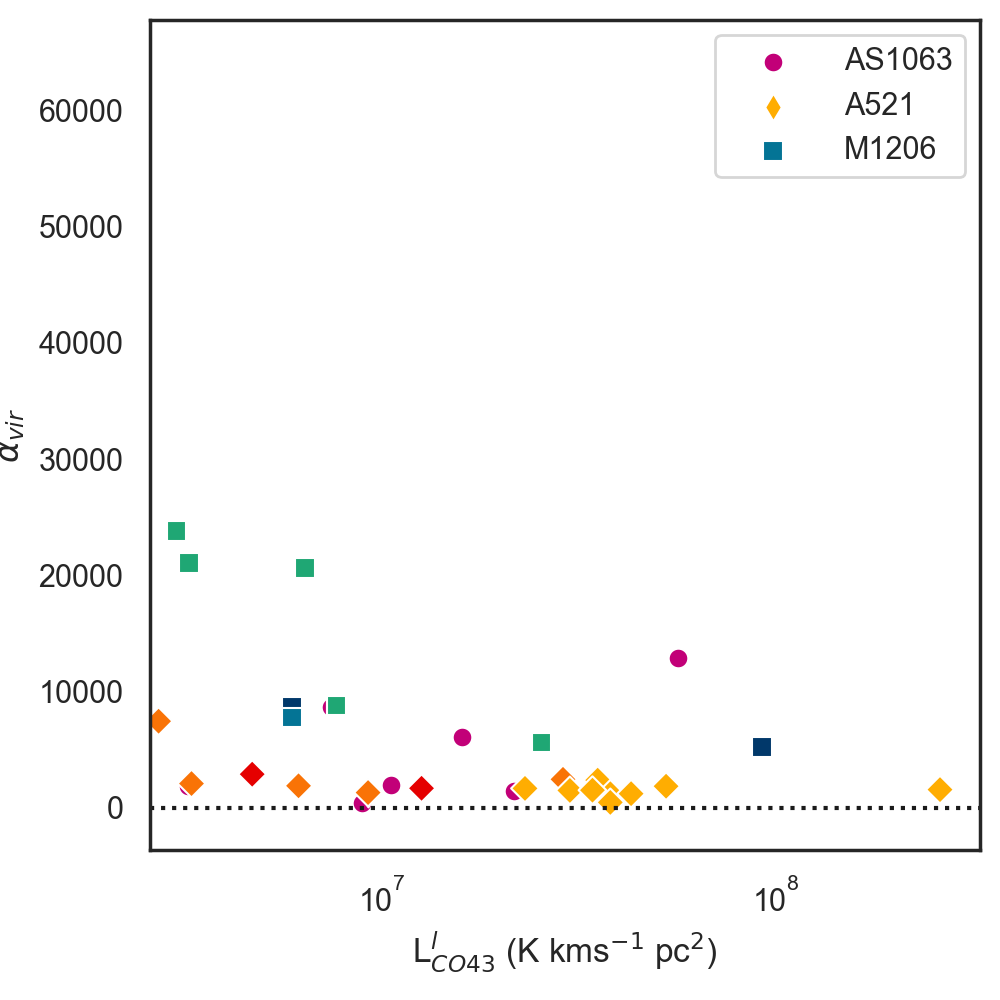

In [101]:
sns.set_style('white')
fig, ax = plt.subplots(1,1,figsize=(5,5))
fig.subplots_adjust(top=0.98,bottom=0.15,right=0.98,left=0.15)

xaxis = 'Ll_CO43'
sns.scatterplot(xaxis,'vir_param',data=as1063,marker='o',label='AS1063',s=50,color=as1063_color)
sns.scatterplot(xaxis,'vir_param',data=a521,marker='d',label='A521',s=50,color=a521_color)
sns.scatterplot(xaxis,'vir_param',data=m1206,marker='s',label='M1206',s=50,color=m1206_color)
sns.scatterplot(xaxis,'vir_param',data=a521,hue='mlt_region',marker='D',label='A521',s=50,palette=a521_pallete,legend=None)
sns.scatterplot(xaxis,'vir_param',data=m1206,hue='mlt_region',marker='s',label='M1206',s=50,palette=m1206_pallete,legend=None)

#ax.set_yscale('log')
ax.set_xscale('log')
#ax.set_ylim(-1,5)
ax.axhline(1,linestyle=':',color='k')
ax.set_ylabel('$\\alpha_{vir}$')
ax.set_xlabel('L$^l_{CO43}$ (K kms$^{-1}$ pc$^2$)')
fig.savefig('../Plots/virialisation.jpeg')

## Alpha CO

<IPython.core.display.Javascript object>


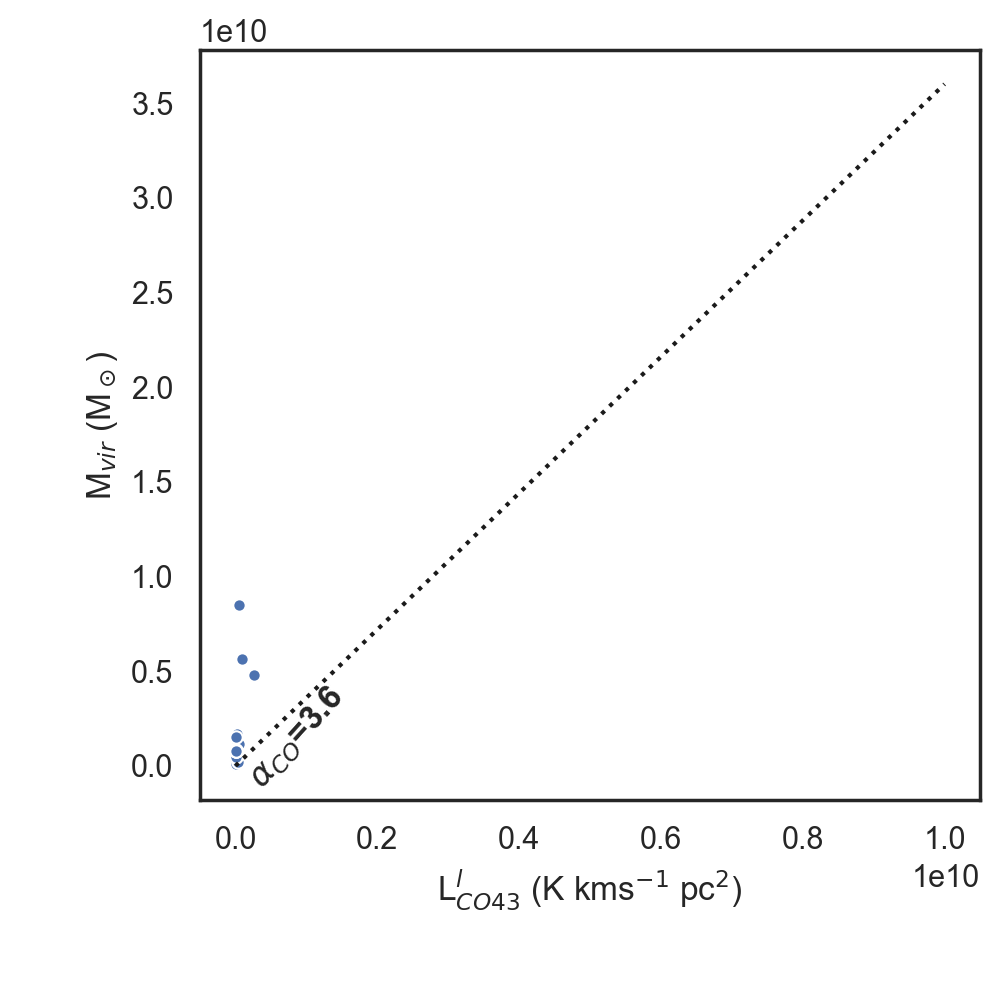

In [106]:
sns.set_style('white')
fig, ax = plt.subplots(1,1,figsize=(5,5))
fig.subplots_adjust(top=0.95,bottom=0.2,right=0.98,left=0.2)

sns.scatterplot('Ll_CO43','Mass_vir',data=all_data,ax=ax)
#plt.plot('Ll_CO43','Mass_vir',ax,log=True)
ax.set_xlabel('L$^{l}_{CO43}$ (K kms$^{-1}$ pc$^2$)')
ax.set_ylabel('M$_{vir}$ (M$_\odot$)')
#ax.set_ylim(10**5,10**10)
ax.plot(np.logspace(4,10),3.6*np.logspace(4,10),color='k',linestyle=':')
ax.annotate('$\\alpha_{CO}$=3.6',xy=(10**8,10**9.5),rotation=48,fontweight='bold')

fig.savefig('../Plots/alpha_CO43.jpeg')

<IPython.core.display.Javascript object>


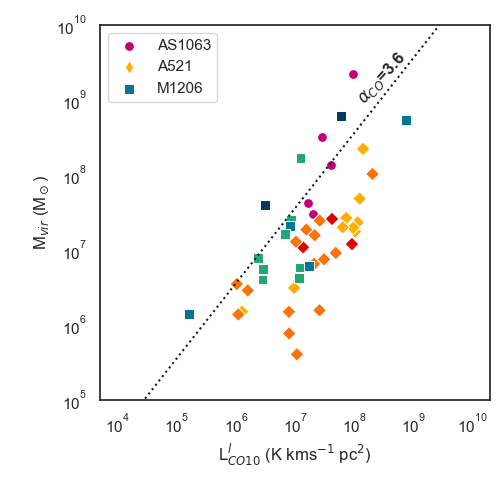

In [289]:
sns.set_style('white')
fig, ax = plt.subplots(1,1,figsize=(5,5))
fig.subplots_adjust(top=0.95,bottom=0.2,right=0.98,left=0.2)

plot('Ll_CO10','Mass_vir',ax,log=True)
ax.set_xlabel('L$^{l}_{CO10}$ (K kms$^{-1}$ pc$^2$)')
ax.set_ylabel('M$_{vir}$ (M$_\odot$)')
ax.set_ylim(10**5,10**10)
ax.plot(np.logspace(4,10),3.6*np.logspace(4,10),color='k',linestyle=':')
ax.annotate('$\\alpha_{CO}$=3.6',xy=(10**8,10**9.5),rotation=48,fontweight='bold')
fig.savefig('../Plots/alpha_CO10.jpeg')